In [1]:
import os
import re
import sys

import numpy as np
import pandas as pd
from scipy.stats import probplot

import pytorch_lightning as pl
import scanpy as sc

import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib.lines import Line2D
import seaborn as sns
import textwrap

import gseapy as gp

pl.seed_everything(32)

sys.path.append("/data/danai/scripts/LIVI/")
from src.analysis._utils import calculate_DxC_effect, calculate_DxC_gene_effect, select_important_genes_for_factor_IQR
from src.analysis.plotting import plot_ct_gex_vs_gt, plot_gene_loadings_for_factor

Seed set to 32
/data/danai/miniforge3/envs/LIVIenv_py311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Seed set to 32


In [2]:
adata = sc.read_h5ad("/data/danai/Data/OneK1K/LogNorm_counts_across_celltypes_DCRM_protein-coding_Azimuth_only-immune-cells_HVG-HEX-10K.h5ad")
adata

AnnData object with n_obs × n_vars = 1172790 × 14212
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'pool', 'individual', 'percent_mt', 'latent', 'nCount_SCT', 'nFeature_SCT', 'cell_type', 'cell_label', 'sex', 'age', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_MITO', 'log1p_total_counts_MITO', 'pct_counts_MITO', 'total_counts_RIBO', 'log1p_total_counts_RIBO', 'pct_counts_RIBO', 'total_counts_ERCC', 'log1p_total_counts_ERCC', 'pct_counts_ERCC', 'n_genes', 'Norm_factors', 'major_celltype', 'predicted_celltype_l0', 'predicted_celltype_l1', 'predicted_celltype_l2', 'original_celltype', 'new_predicted_celltype_l2', 'new_predicted_celltype_l0', 'new_predicted_celltype_l1'
    var: 'GeneSymbol', 'features', 'MITO', 'RIBO', 'ERCC', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'downregulated_NK', '

In [3]:
gene_anno = pd.read_csv("/data/danai/Data/OneK1K/OneK1K_HVG-HEX-10K_geneIDs_Biomart.txt", sep="\t", index_col=0)
gene_anno.rename(columns={"Gene stable ID":"feature_id", 
                         "Gene name":"gene_name",
                         "Chromosome/scaffold name":"gene_chromosome", 
                         "Gene start (bp)":"gene_start", 
                         "Gene end (bp)":"gene_end"},
                inplace=True)
gene_anno

,gene_start,gene_chromosome,gene_end,gene_name
Gene stable ID,,,,
ENSG00000000419,49551404,20,49575092,DPM1
ENSG00000000457,169818772,1,169863408,SCYL3
ENSG00000000460,169631245,1,169823221,C1orf112
ENSG00000000938,27938575,1,27961788,FGR
ENSG00000000971,196621008,1,196716634,CFH
...,...,...,...,...
ENSG00000273269,47293080,2,47403650,RP11-761B3.1
ENSG00000273274,32930670,1,32962287,ZBTB8B
ENSG00000273294,33987279,5,34124633,RP11-1084J3.4


In [4]:
adata.var.GeneSymbol = adata.var.GeneSymbol.str.strip()
adata.var = adata.var.merge(gene_anno.filter(["gene_chromosome", "gene_start", "gene_end"]), right_index=True, left_index=True)
adata.var = adata.var.assign(upstream_5MB = adata.var.apply(lambda x: max(0, x.gene_start - 5000000), axis=1),
                             downstream_5MB = adata.var.apply(lambda x: x.gene_end + 5000000, axis=1))

In [5]:
# COLORS FROM THE ORIGINAL PUBLICATION
cell_label_colors = {
    "CD4 SOX4": "#D6C1DE", # SOX4+ CD4 T cells
    "CD4 NC": "#882E72", # CD4 naive T cells
    "CD4 ET": "#B178A6", # CD4 effector T cells
    "CD8 NC": "#5289C7", # CD8 naive T cells
    "CD8 S100B": "#7BAFDE", # S100B+ CD8 cells
    "CD8 ET": "#1965B0", # CD8 effector cells 
    "NK": "#4EB265",
    "NK R": "#90C987", # NK recruiting cells
    "B IN": "#F6C141",
    "B Mem": "#F7EE55",
    "Mono C": "#F1932D", # classical monocytes
    "Mono NC": "#E8601C", # non-classical monocytes
    "DC": "#DC050C",
    "Plasma": "#CAE0AB",
}


In [6]:
background_genes = adata.var.GeneSymbol
# databases_bio = ["GO_Biological_Process_2023", "Elsevier_Pathway_Collection",  "GO_Molecular_Function_2023", "KEGG_2021_Human", "Reactome_2022"] 
databases_bio = ["GO_Biological_Process_2023", "GO_Molecular_Function_2023", "KEGG_2021_Human", "Reactome_2022"] 

In [2]:
cis_eQTLGen_hvgs = pd.read_csv("/data/danai/Data/eQTLGen_cis-eQTLs_trans-eQTLGen-disease-associated-SNPs_OneK1K-10K-HVG-HEX.tsv", sep="\t")
cis_eQTLGen_hvgs.head()

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,snp_id
0,3.271700e-310,rs2910686,5,96252589,C,T,163.6570,ENSG00000164308,ERAP2,5,96233531,34,26454,0.0,4.166200e-302,5:96252589
1,3.271700e-310,rs27290,5,96350088,G,A,160.0384,ENSG00000164308,ERAP2,5,96233531,35,26568,0.0,4.166200e-302,5:96350088
2,3.271700e-310,rs1363907,5,96252803,A,G,151.8370,ENSG00000164308,ERAP2,5,96233531,34,26454,0.0,4.166200e-302,5:96252803
3,3.271700e-310,rs2549794,5,96244549,C,T,150.5419,ENSG00000164308,ERAP2,5,96233531,33,26070,0.0,4.166200e-302,5:96244549
4,3.271700e-310,rs4761234,12,69732105,C,T,-143.3691,ENSG00000090382,LYZ,12,69745067,35,31353,0.0,4.166200e-302,12:69732105


In [3]:
trans_eQTLGen_sign = pd.read_csv("/data/danai/Data/OneK1K/trans-eQTLGen-FDR005_OneK1K.tsv", sep="\t")
trans_eQTLGen_sign = trans_eQTLGen_sign.assign(snp_id = [i[0]+":"+i[1] for i in trans_eQTLGen_sign.SNP_id1.str.split("_")])
trans_eQTLGen_sign = trans_eQTLGen_sign.assign(QTL = trans_eQTLGen_sign.apply(lambda x: x.Gene+"-"+x.snp_id, axis=1))
trans_eQTLGen_sign.head()

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,SNP_id1,SNP_id2,snp_id,QTL
0,1.128895e-308,rs1354034,3,56849749,T,C,-57.2518,ENSG00000163736,PPBP,4,74853334,37,31684,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000163736-3:56849749
1,1.128895e-308,rs1354034,3,56849749,T,C,-50.8175,ENSG00000198478,SH3BGRL2,6,80377186,37,31684,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000198478-3:56849749
2,1.128895e-308,rs1354034,3,56849749,T,C,-50.6486,ENSG00000005961,ITGA2B,17,42458210,36,31470,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000005961-3:56849749
3,1.128895e-308,rs1354034,3,56849749,T,C,-49.9996,ENSG00000122786,CALD1,7,134542241,36,31644,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000122786-3:56849749
4,1.128895e-308,rs1354034,3,56849749,T,C,-45.3023,ENSG00000166091,CMTM5,14,23847499,37,31684,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000166091-3:56849749


In [7]:
GT_matrix = pd.read_csv("/data/danai/Data/OneK1K/GT_matrix_trans-eQTLGen_in_OneK1K.tsv", sep="\t", index_col=0)
GT_matrix

,1_1,2_2,3_3,4_4,6_6,7_7,8_8,9_9,10_10,11_11,...,1079_1080,1080_1081,1081_1082,1083_1084,1084_1085,1096_845_2,1100_914_2,1102_932_2,1103_926_2,1104_920_2
SNP_id,,,,,,,,,,,,,,,,,,,,,
1_1247494_C_T,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,...,2.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0
1_1894284_T_C,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,...,2.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,0.0,1.0
1_2069172_C_T,2.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0,1.0,2.0,...,1.0,1.0,1.0,1.0,1.0,0.0,2.0,1.0,2.0,2.0
1_2146165_C_A,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
1_2233961_G_A,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,...,2.0,1.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22_50971752_C_A,1.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,0.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0
22_50991033_T_C,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,...,0.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,0.0,2.0
22_51063477_T_C,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0


In [8]:
hg_mapping = pd.read_csv("/data/danai/Data/OneK1K/trans-eQTL-Gen_liftOver_results.tsv", sep="\t")
hg_mapping

,SNP_id_hg38,SNP_id_hg19
0,1:1312114,1:1247494
1,1:1962845,1:1894284
2,1:2137733,1:2069172
3,1:2214726,1:2146165
4,1:2302522,1:2233961
...,...,...
9299,22:50533323,22:50971266
9300,22:50552604,22:50971752
9301,22:50625049,22:50991033
9302,22:50663510,22:51063477


In [9]:
rsids = pd.read_csv("/data/danai/Data/OneK1K/ALL_chroms.dose.filtered.R2_0.8_001MAF_HWE_trans-eQTLGen_rsIDs.bim",
                    sep="\t", index_col=False, names=["chr", "rsID", "bla", "position", "a0", "a1"])
rsids = rsids.assign(SNP_id_hg19 = rsids.chr.astype(str) + ":" + rsids.position.astype(str))
rsids

,chr,rsID,bla,position,a0,a1,SNP_id_hg19
0,1,1:1247494,0,1247494,T,C,1:1247494
1,1,rs4648739,0,1894284,C,T,1:1894284
2,1,rs425277,0,2069172,T,C,1:2069172
3,1,rs78265569,0,2146165,A,C,1:2146165
4,1,rs11576356,0,2233961,A,G,1:2233961
...,...,...,...,...,...,...,...
9300,22,22:50971752,0,50971752,A,C,22:50971752
9301,22,22:50991033,0,50991033,C,T,22:50991033
9302,22,rs6151429,0,51063477,C,T,22:51063477
9303,22,rs6010044,0,51101938,C,A,22:51101938


In [10]:
snp_mapping = hg_mapping.merge(rsids.filter(["SNP_id_hg19", "rsID", "a0", "a1"]), how="left", on="SNP_id_hg19")
snp_mapping = snp_mapping.drop_duplicates()
snp_mapping.shape

(9310, 5)

In [11]:
SNP_dict = dict(zip(GT_matrix.index, [i[0]+":"+i[1] for i in GT_matrix.index.str.split("_")]))
SNP_dict_inv = {v:k for k,v in SNP_dict.items()}

In [12]:
results_dir = "/data/danai/Data/OneK1K/LIVI2_testing_results/"
model = "2024-12-05_10-20_LIVIcis-cell-state_zdim15_700-gxc_5-persistent_60-0-warm-up_no-adversary_Gseed200_hvg-hex-10K_larger-encoder_best"
model_results_dir = os.path.join(results_dir, model)
os.path.isdir(model_results_dir)

True

In [13]:
sc.settings.figdir = os.path.join(model_results_dir, "Figures")

In [14]:
GxC_effects = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_LMM_results_BH-0.05_Ucontext.tsv"),
    sep="\t"
)
GxC_effects.Factor = GxC_effects.Factor.str.replace("U_", "D_")
GxC_effects.SNP_id.nunique()

941

In [15]:
GxC_effects[["SNP_chrom", "SNP_pos"]] = GxC_effects.SNP_id.str.split(":", expand=True)

GxC_effects = GxC_effects.assign(fQTL = GxC_effects["SNP_id"]+"__"+GxC_effects["Factor"])

In [16]:
# Rename SNPs for plotting
GxC_effects = GxC_effects.assign(SNP = GxC_effects.SNP_id)
GxC_effects = GxC_effects.assign(SNP_id = GxC_effects.SNP.map(SNP_dict_inv))
GxC_effects.head()

,Factor,SNP_id,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue,SNP_chrom,SNP_pos,fQTL,SNP
0,D_Factor1,14_81884515_G_A,0.128089,0.029964,1.747683e-05,G,3.124271e-02,14,81884515,14:81884515__D_Factor1,14:81884515
1,D_Factor5,19_58963530_G_A,0.585091,0.071890,1.218412e-16,G,8.928493e-13,19,58963530,19:58963530__D_Factor5,19:58963530
2,D_Factor11,6_161111700_C_T,1.012741,0.201583,4.265749e-07,C,1.083497e-03,6,161111700,6:161111700__D_Factor11,6:161111700
3,D_Factor12,3_39555580_A_G,0.505091,0.055674,1.831975e-20,A,1.759641e-16,3,39555580,3:39555580__D_Factor12,3:39555580
4,D_Factor14,2_232579379_G_A,-0.201663,0.025578,1.112895e-15,G,7.537058e-12,2,232579379,2:232579379__D_Factor14,2:232579379


In [17]:
DxC_decoder = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_GxC_decoder.tsv"),
    sep="\t", index_col=0
)
DxC_decoder.columns = DxC_decoder.columns.str.replace("GxC", "DxC")
DxC_decoder.head()

,DxC_Factor1,DxC_Factor2,DxC_Factor3,DxC_Factor4,DxC_Factor5,DxC_Factor6,DxC_Factor7,DxC_Factor8,DxC_Factor9,DxC_Factor10,...,DxC_Factor691,DxC_Factor692,DxC_Factor693,DxC_Factor694,DxC_Factor695,DxC_Factor696,DxC_Factor697,DxC_Factor698,DxC_Factor699,DxC_Factor700
Geneid,,,,,,,,,,,,,,,,,,,,,
ENSG00000257019,0.000003,-0.000156,0.000261,-0.000105,0.000109,-0.000148,0.000145,0.000002,0.000106,-0.000083,...,-0.000125,-0.000088,0.000062,-0.000037,-0.000043,-0.000013,-0.000199,-0.000141,0.000042,0.000049
ENSG00000166987,-0.000101,-0.000302,0.000002,-0.000025,0.000096,-0.000122,0.000290,-0.000218,-0.000033,0.000128,...,-0.000093,-0.000059,-0.000712,0.000007,-0.000217,0.000056,0.000027,0.000117,-0.000141,0.000014
ENSG00000170624,-0.000007,-0.000096,-0.000228,0.000753,-0.000033,-0.000042,-0.000032,0.001457,0.000291,-0.000079,...,-0.000690,0.000181,-0.004836,0.000014,-0.000040,0.000021,0.000080,0.000070,-0.000669,-0.000014
ENSG00000140519,0.000013,-0.000071,0.000062,-0.000007,-0.000070,0.000082,-0.000036,0.000126,-0.000059,-0.000021,...,0.000164,0.000251,-0.000099,0.000035,-0.000080,-0.000019,-0.000139,0.000042,-0.000011,-0.000129
ENSG00000117115,-0.000463,-0.000236,0.000113,-0.000527,0.000036,0.000147,-0.000130,-0.000716,-0.000064,0.000002,...,0.000046,0.000210,0.000123,-0.000185,-0.000235,0.000060,-0.000145,0.000712,-0.000128,-0.000025


In [18]:
D = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_U_embedding.tsv"),
    sep="\t", index_col=0
)
D.columns = D.columns.str.replace("U_", "D_")
D.head()

,D_Factor1,D_Factor2,D_Factor3,D_Factor4,D_Factor5,D_Factor6,D_Factor7,D_Factor8,D_Factor9,D_Factor10,...,D_Factor691,D_Factor692,D_Factor693,D_Factor694,D_Factor695,D_Factor696,D_Factor697,D_Factor698,D_Factor699,D_Factor700
individual,,,,,,,,,,,,,,,,,,,,,
691_692,-1.042473,-3.014132,1.014801,1.139763,-0.087979,-0.651705,0.490216,-0.437837,-0.698968,-0.075018,...,-1.559727,-2.399024,-0.448335,-0.562907,1.627759,0.417358,-0.134628,0.011702,-0.679321,0.457391
693_694,0.204075,-1.975144,-0.909941,-3.882647,-2.031409,-1.043576,-0.600040,0.700274,-1.798226,1.284830,...,-4.333742,-0.440545,3.113877,-1.716786,-1.533546,0.933507,1.020350,0.339764,-1.053410,0.119764
688_689,-0.265995,-0.624907,-0.622831,-2.176815,0.853737,-0.117719,0.055314,0.302469,0.608836,-1.786304,...,-0.670751,-1.207303,8.913930,-0.353388,-0.325745,-1.125641,0.403694,-0.928585,0.525144,-0.484701
683_684,0.416159,-2.862958,-0.515983,1.572177,0.868042,-0.119366,-0.109651,0.556453,1.886532,-1.681124,...,-2.243293,-1.778274,0.387456,0.630929,-0.590417,0.165828,-2.937147,0.222008,-0.201923,0.057328
684_685,-1.244226,-4.169203,-0.287462,-0.519455,3.750650,-1.336222,0.230874,-0.624908,1.064494,0.636243,...,0.699778,-3.021685,-0.273128,-0.655736,-0.635290,0.228497,1.079147,-1.051518,0.797644,0.003049


In [19]:
assignment_matrix = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_factor_assignment_matrix.tsv"),
    sep="\t", index_col=0
)
assignment_matrix.columns = assignment_matrix.columns.str.replace("U_", "D_")
assignment_matrix.head()

,D_Factor1,D_Factor2,D_Factor3,D_Factor4,D_Factor5,D_Factor6,D_Factor7,D_Factor8,D_Factor9,D_Factor10,...,D_Factor691,D_Factor692,D_Factor693,D_Factor694,D_Factor695,D_Factor696,D_Factor697,D_Factor698,D_Factor699,D_Factor700
Cell-state_Factor1,8.437773e-07,7.903217e-08,0.000149,2.960464e-08,0.105288,9.999727e-01,5.675518e-07,0.958925,0.000287,0.000158,...,5.023212e-06,4.209568e-06,1.000000e+00,4.168299e-03,9.999992e-01,0.209136,0.078419,6.167789e-07,0.018491,0.140772
Cell-state_Factor2,1.292795e-06,6.067657e-08,0.000136,6.915393e-08,0.105908,1.794856e-02,5.106163e-07,0.115423,0.026317,0.000138,...,1.773568e-07,6.894123e-06,7.097198e-02,2.241115e-07,8.517019e-07,0.047724,0.001983,7.762388e-07,0.000035,0.041986
Cell-state_Factor3,9.953613e-07,6.230532e-08,0.000141,1.447328e-06,0.000004,4.638549e-07,9.892867e-01,0.965989,0.000585,0.000156,...,2.023449e-07,2.216382e-06,5.867200e-05,5.172464e-03,6.707507e-07,0.132809,0.001249,1.094831e-06,0.938939,0.154773
Cell-state_Factor4,6.680752e-07,6.124807e-02,0.000136,3.778137e-08,0.011434,4.063994e-07,9.991040e-01,0.019197,0.008096,0.000136,...,2.121831e-07,3.456871e-07,4.101363e-08,3.866343e-07,6.646220e-07,0.102437,0.012960,7.976132e-07,0.000011,0.032869
Cell-state_Factor5,4.728630e-06,2.615931e-08,0.000146,6.789284e-04,0.123782,2.302163e-07,5.004259e-07,1.000000,0.305943,0.000152,...,8.162028e-08,3.348259e-02,3.075602e-08,2.127417e-07,4.462411e-07,0.080859,0.288426,5.094969e-07,0.029717,0.271452


In [20]:
cell_state = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_cell-state_latent.tsv"),
    sep="\t", index_col=0
)

In [47]:
umap_cc = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_cell-state_latent_UMAP.tsv"),
    sep="\t", index_col=0
)

In [26]:
adata.obsm["X_umap"] = umap_cc.loc[adata.obs.index].to_numpy()

In [21]:
trans_fSNPs = pd.read_csv(
    os.path.join(model_results_dir, "trans-fSNPs_only-LIVI.tsv"), sep="\t"
)
trans_fSNPs.SNP_id.nunique()

294

### Compare fQTL efect size vs. number of genes with high loadings

#### trans-fSNPs only

In [44]:
factors = []
ntopgenes = []
betas = []
for _,row in trans_fSNPs.iterrows():
    topgenes = select_important_genes_for_factor_IQR(
        genes_factors_loadings=DxC_decoder.to_numpy(),
        factor_idx=int(row.Factor.replace("D_Factor", ""))-1,
        gene_names=adata.var.loc[DxC_decoder.index].GeneSymbol,
        direction="both",
        threshold = 100,
        plot = False,
    )
    factors.append(row.Factor.replace("D", "DxC"))
    ntopgenes.append(len(topgenes))
    betas.append(abs(row["effect_size"]))


/data/danai/scripts/LIVI/src/analysis/_utils.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


In [45]:
ngenes_beta = pd.DataFrame({"Factor": factors, "N_genes": ntopgenes, "effect_size": betas})
ngenes_beta 

,Factor,N_genes,effect_size
0,DxC_Factor19,4,0.242943
1,DxC_Factor21,2,0.273905
2,DxC_Factor25,6,0.186891
3,DxC_Factor39,6,0.176963
4,DxC_Factor44,3,0.224585
...,...,...,...
349,DxC_Factor683,18,0.342276
350,DxC_Factor686,2,0.159172
351,DxC_Factor690,1,0.339352
352,DxC_Factor691,10,0.280535


## SNP effects on groups of genes/regulatory pathways

In [30]:
ngenes_beta.loc[ngenes_beta.N_genes > 20] 

,Factor,N_genes,effect_size
23,DxC_Factor110,31,0.460210
112,DxC_Factor310,32,0.182800
353,DxC_Factor693,28,0.795629


In [32]:
# Pick the one with the largest effect size
trans_fSNPs.loc[trans_fSNPs.Factor == "D_Factor693"]

,SNP_id,Factor,fQTL,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue,SNP_chrom,SNP_pos
353,11:128391937,D_Factor693,11:128391937__D_Factor693,-0.795629,0.176991,0.000006,C,0.0127,11,128391937


## SNP 11:128391937 (rs61907765) on DxC693

In [5]:
trans_eQTLGen_sign.loc[trans_eQTLGen_sign.snp_id == "11:128391937"]

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,SNP_id1,SNP_id2,snp_id,QTL
10556,6.568500e-09,rs61907765,11,128391937,T,C,5.8017,ENSG00000167094,TTC16,9,130486112,36,31568,0.000113,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000167094-11:128391937
11747,2.030300e-08,rs61907765,11,128391937,T,C,-5.6092,ENSG00000197057,DTHD1,4,36315311,32,26180,0.000205,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000197057-11:128391937
12094,2.710100e-08,rs61907765,11,128391937,T,C,-5.5591,ENSG00000181847,TIGIT,3,114012447,35,31354,0.000325,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000181847-11:128391937
15213,1.975800e-07,rs61907765,11,128391937,T,C,5.2017,ENSG00000176083,ZNF683,1,26694569,36,31568,0.001681,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000176083-11:128391937
25604,6.085400e-06,rs61907765,11,128391937,T,C,-4.5234,ENSG00000113088,GZMK,5,54325239,36,31568,0.033075,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000113088-11:128391937


In [10]:
trans_eQTLGen_sign.loc[(trans_eQTLGen_sign.snp_id == "11:128391937") & (trans_eQTLGen_sign.Gene.isin(DxC_decoder["DxC_Factor693"].abs().nlargest(28).index))]

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,SNP_id1,SNP_id2,snp_id,QTL
11747,2.030300e-08,rs61907765,11,128391937,T,C,-5.6092,ENSG00000197057,DTHD1,4,36315311,32,26180,0.000205,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000197057-11:128391937
12094,2.710100e-08,rs61907765,11,128391937,T,C,-5.5591,ENSG00000181847,TIGIT,3,114012447,35,31354,0.000325,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000181847-11:128391937
15213,1.975800e-07,rs61907765,11,128391937,T,C,5.2017,ENSG00000176083,ZNF683,1,26694569,36,31568,0.001681,1.0,11_128391937_T_C,11_128391937_C_T,11:128391937,ENSG00000176083-11:128391937


In [11]:
replicating_genes = trans_eQTLGen_sign.loc[(trans_eQTLGen_sign.snp_id == "11:128391937") & (trans_eQTLGen_sign.Gene.isin(DxC_decoder["DxC_Factor693"].abs().nlargest(28).index))].Gene.tolist()
replicating_genes

['ENSG00000197057', 'ENSG00000181847', 'ENSG00000176083']

In [4]:
cis_eQTLGen_hvgs.loc[cis_eQTLGen_hvgs.snp_id == "11:128391937"]

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,snp_id
17150,1.766300e-10,rs61907765,11,128391937,T,C,6.3804,ENSG00000134954,ETS1,11,128393046,35,31526,0.0,0.022492,11:128391937


In [32]:
# Known associated gene is the TF ETS1
adata.var.loc["ENSG00000134954"]

GeneSymbol                    ETS1
features                      ETS1
MITO                         False
RIBO                         False
ERCC                         False
n_cells_by_counts           352740
mean_counts               0.355675
log1p_mean_counts         0.304299
pct_dropout_by_counts    72.279525
total_counts              452592.0
log1p_total_counts       13.022749
highly_variable              False
means                      0.29745
dispersions               0.244165
dispersions_norm          0.002282
downregulated_NK              True
upregulated_NK                True
upregulated_CD4T              True
downregulated_CD4T           False
upregulated_CD8T              True
downregulated_CD8T            True
upregulated_B                 True
downregulated_B               True
upregulated_Mono              True
downregulated_Mono            True
upregulated_DC               False
downregulated_DC              True
gene_chromosome                 11
gene_start          

In [49]:
rsid = snp_mapping.loc[snp_mapping.SNP_id_hg19 == "11:128391937"].rsID.iloc[0]
rsid

'rs61907765'

In [36]:
snp_mapping.loc[snp_mapping.SNP_id_hg19 == "11:128391937"]

,SNP_id_hg38,SNP_id_hg19,rsID,a0,a1
6382,11:128536543,11:128391937,rs61907765,T,C


In [37]:
SNP_dict_inv["11:128391937"]

'11_128391937_C_T'

/tmp/ipykernel_1153690/2032097076.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


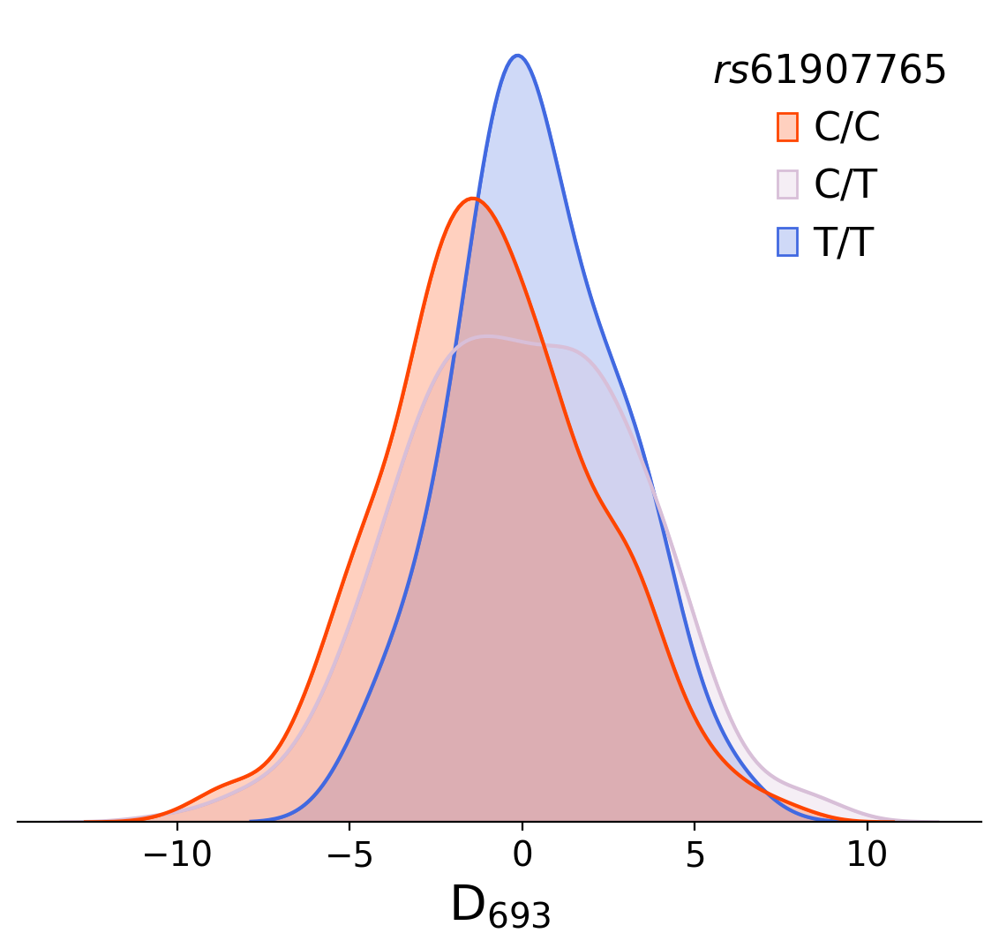

In [29]:
tmp = pd.merge(D["D_Factor693"], GT_matrix.loc[SNP_dict_inv["11:128391937"]].astype(int), right_index=True, left_index=True, how="left")
labels_dict = dict(zip([0, 1, 2], ["T/T", "C/T", "C/C"]))
tmp["11_128391937_C_T"].replace(labels_dict, inplace=True)
tmp.rename(columns={"11_128391937_C_T":f"${rsid}$"}, inplace=True)

legend_handles = []
legend_labels = []

p = sns.kdeplot(x="D_Factor693", hue=f"${rsid}$", fill=True, data=tmp, palette=["orangered", "thistle", "royalblue"], 
                hue_order=["C/C", "C/T", "T/T"], legend=True, common_norm=False)
p = sns.kdeplot(x="D_Factor693", hue=f"${rsid}$", fill=False, data=tmp, palette=["orangered", "thistle", "royalblue"], 
                hue_order=["C/C", "C/T", "T/T"], legend=False, common_norm=False)

p.set_xlabel("D$_{693}$", fontsize=20)
p.tick_params(axis="x", labelsize=14) 
p.set_ylabel("")
p.set_yticks([])
p.spines["left"].set_visible(False)
p.spines["right"].set_visible(False)
p.spines["top"].set_visible(False)

leg = p.get_legend()
legend_labels = [t.get_text() for t in leg.get_texts()]
legend_handles = leg.legend_handles
# labels_dict = dict(zip(legend_labels, ["T/T", "C/T", "C/C"]))

p.legend(title=f"${rsid}$", handles=legend_handles, labels=legend_labels, frameon=False, title_fontsize=16, fontsize=16)

plt.savefig(os.path.join(model_results_dir, "Figures", "KDEplot_D693_colored-by_11-128391937_wo-y-axis.png"), 
            transparent=True, dpi=400, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", "KDEplot_D693_colored-by_11-128391937_wo-y-axis.eps"), 
            transparent=True, dpi=400, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", "KDEplot_D693_colored-by_11-128391937_wo-y-axis.pdf"), 
            transparent=True, dpi=400, bbox_inches="tight")

/data/danai/scripts/LIVI/src/analysis/plotting.py:2173: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/data/danai/scripts/LIVI/src/analysis/plotting.py:2177: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


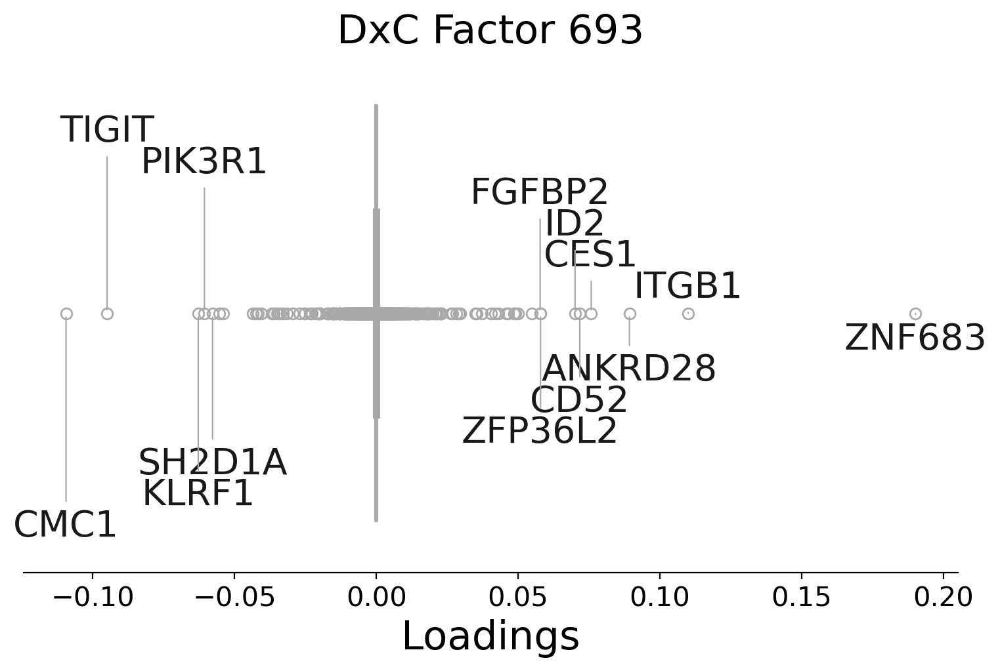

In [36]:
plot_gene_loadings_for_factor(
    DxC_decoder=DxC_decoder,
    factor="DxC_Factor693",
    adata_var=adata.var,
    gene_name_column="GeneSymbol",
    color="darkgrey",
    spines_invisible=True,
    n_top_genes=13,
    genes_to_annotate=None,
    annotation_fontsize=20,
    offset=0.06,
    x_distance=8e-2,
    savefig=os.path.join(model_results_dir, "Figures", "Gene-loadings_DxC693_11-128391937_trans-fSNP.pdf"),
)

In [38]:
enr_gxc = gp.enrichr(gene_list = adata.var.loc[DxC_decoder["DxC_Factor693"].abs().nlargest(28).index].GeneSymbol.tolist(), 
                          gene_sets = databases_bio, # ["GO_Biological_Process_2023","Reactome_2022"],
                          background = background_genes.values,
                          outdir=None)
enr_gxc_sign = enr_gxc.results.loc[enr_gxc.results["Adjusted P-value"] <= 0.05]
enr_gxc_sign.sort_values("Adjusted P-value", ascending=True).head(20).sort_values("Odds Ratio", ascending=False)


,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Regulation Of B Cell Differentiation (GO:0045577),0.000002,0.001100,0,0,154.418182,1993.977553,ID2;CD27;ZFP36L2
2,GO_Biological_Process_2023,Regulation Of Lymphocyte Differentiation (GO:0...,0.000388,0.034341,0,0,83.745562,657.820096,ZNF683;ZFP36L2
3,GO_Biological_Process_2023,Negative Regulation Of Lymphocyte Activation (...,0.000501,0.034341,0,0,72.569231,551.433920,TNFAIP3;TIGIT
4,GO_Biological_Process_2023,Negative Regulation Of B Cell Activation (GO:0...,0.000501,0.034341,0,0,72.569231,551.433920,ID2;TNFAIP3
5,GO_Biological_Process_2023,Cellular Response To Low-Density Lipoprotein P...,0.000629,0.034341,0,0,64.022624,471.984976,ITGB1;CES1
6,GO_Biological_Process_2023,Entrainment Of Circadian Clock By Photoperiod ...,0.000697,0.034341,0,0,60.461538,439.435545,ID2;BHLHE40
8,GO_Biological_Process_2023,Photoperiodism (GO:0009648),0.000770,0.034341,0,0,57.275304,410.615454,ID2;BHLHE40
9,GO_Biological_Process_2023,Regulation Of B Cell Activation (GO:0050864),0.000770,0.034341,0,0,57.275304,410.615454,TNFAIP3;ZFP36L2
10,GO_Biological_Process_2023,Negative Regulation Of Fat Cell Differentiatio...,0.001095,0.044382,0,0,47.301003,322.467718,RORA;ZFP36L2
525,KEGG_2021_Human,Bacterial invasion of epithelial cells,0.000178,0.022743,0,0,31.953962,275.938934,ITGB1;ARPC5L;PIK3R1


In [50]:
enr_gxc_sign.sort_values("Adjusted P-value", ascending=True).to_csv(
    os.path.join(model_results_dir, "GSEA-results_DxC693_top-28-genes.tsv"), 
    sep="\t", header=True, index=False
)

/data/danai/scripts/LIVI/src/analysis/plotting.py:2176: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/data/danai/scripts/LIVI/src/analysis/plotting.py:2180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


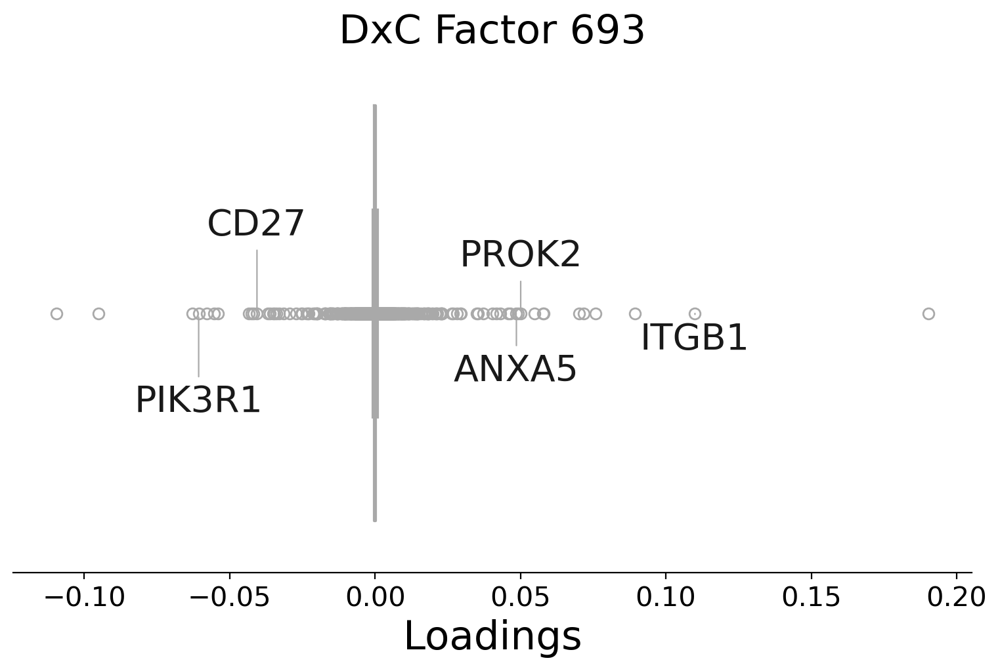

In [53]:
plot_gene_loadings_for_factor(
    DxC_decoder=DxC_decoder,
    factor="DxC_Factor693",
    adata_var=adata.var,
    gene_name_column="GeneSymbol",
    color="darkgrey",
    spines_invisible=True,
    n_top_genes=15,
    genes_to_annotate=adata.var.loc[adata.var.GeneSymbol.isin(enr_gxc_sign.loc[enr_gxc_sign.Term.str.contains("Negative Regulation Of Apoptotic Process")].Genes.iloc[0].split(";"))].index,
    annotation_fontsize=20,
    offset=0.06,
    x_distance=8e-2,
    savefig=os.path.join(model_results_dir, "Figures", "Gene-loadings_GxC693_11-128391937_trans-fSNP_Negative-regulation-of-apoptotic-process.pdf"),
)

/data/danai/scripts/LIVI/src/analysis/plotting.py:2176: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/data/danai/scripts/LIVI/src/analysis/plotting.py:2180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


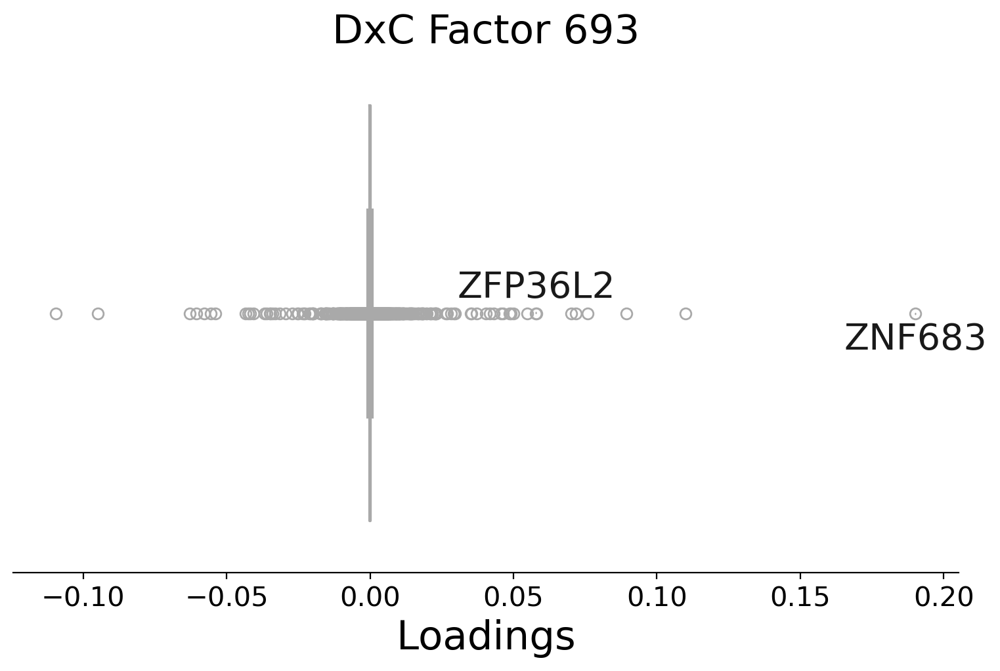

In [78]:
plot_gene_loadings_for_factor(
    DxC_decoder=DxC_decoder,
    factor="DxC_Factor693",
    adata_var=adata.var,
    gene_name_column="GeneSymbol",
    color="darkgrey",
    spines_invisible=True,
    n_top_genes=15,
    genes_to_annotate=adata.var.loc[adata.var.GeneSymbol.isin(enr_gxc_sign.loc[enr_gxc_sign.Term.str.contains("Regulation Of Lymphocyte Differentiation")].Genes.iloc[0].split(";"))].index,
    annotation_fontsize=20,
    offset=0.06,
    x_distance=8e-2,
    savefig=os.path.join(model_results_dir, "Figures", "Gene-loadings_DxC693_11-128391937_trans-fSNP_regulation-lymphocyte-differentiation.eps"),
)

In [40]:
DxC_beta = calculate_DxC_effect(
    DxC_associations = GxC_effects,
    SNP_id = SNP_dict_inv["11:128391937"],
    cell_state_latent = cell_state,
    A = assignment_matrix,
)
DxC_beta.head()

,DxC_Factor693
barcode,
AAACCTGAGAATGTTG-1,-0.046458
AAACCTGAGAGAACAG-1,-0.073261
AAACCTGAGCATGGCA-1,-0.051195
AAACCTGAGTATTGGA-1,-0.068081
AAACCTGAGTGTCCCG-1,-0.144004


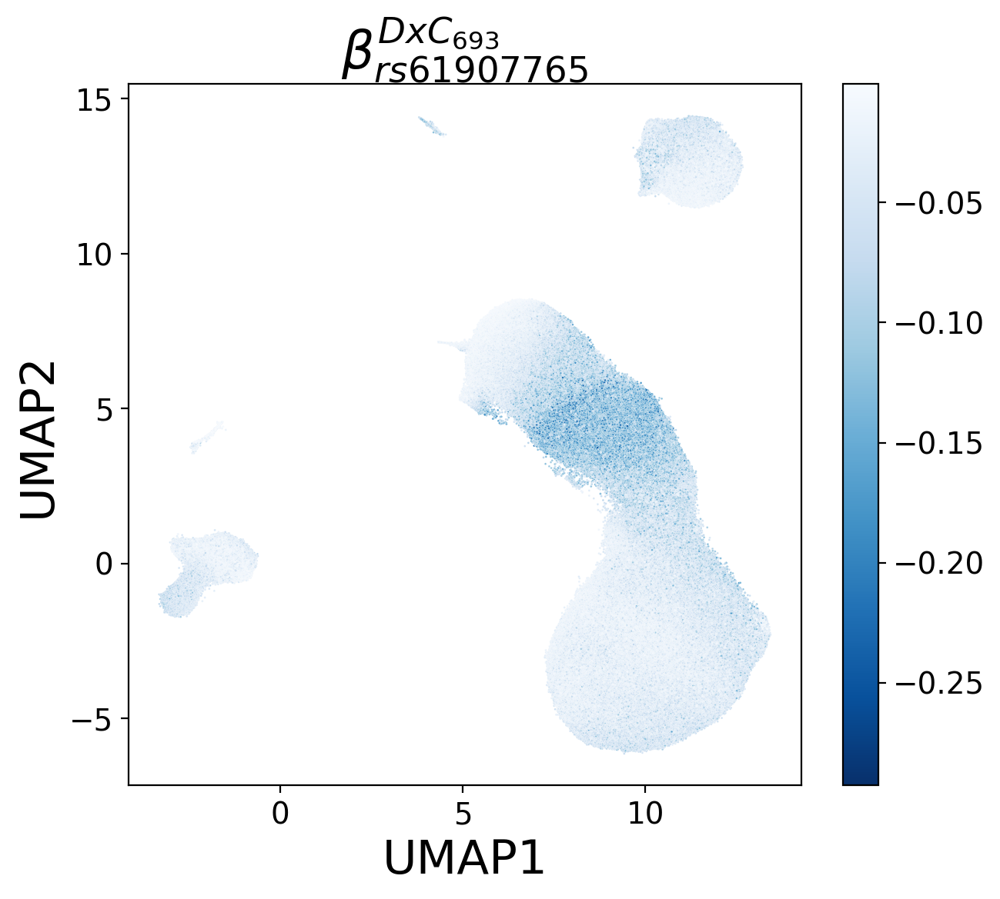

In [28]:
fig, axs = plt.subplots(figsize=(7,6))
sns.scatterplot(
    x="UMAP1",
    y="UMAP2",
    hue="DxC_Factor693",
    data=umap_cc.merge(DxC_beta, right_index=True, left_index=True),
    ax=axs,
    s=1,
    palette="Blues_r",
    rasterized=True,
    legend=False,
)

sm = cm.ScalarMappable(
    cmap="Blues_r",
    norm=colors.Normalize(
        vmin=DxC_beta["DxC_Factor693"].min(),
        vmax=DxC_beta["DxC_Factor693"].max(),
    ),
)
cb = plt.colorbar(sm, ax=axs)

axs.set_title(
    label=fr"$\beta_{{{rsid}}}^{{DxC_{{693}}}}$", fontdict={"fontsize": 24}, loc="center"
)
axs.xaxis.label.set_fontsize(22)
axs.yaxis.label.set_fontsize(22)

plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937_effect-on-cells_trans-fSNP.png"),
                         dpi=500, transparent=True, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937_effect-on-cells_trans-fSNP.pdf"),
                         dpi=800, transparent=True, bbox_inches="tight")

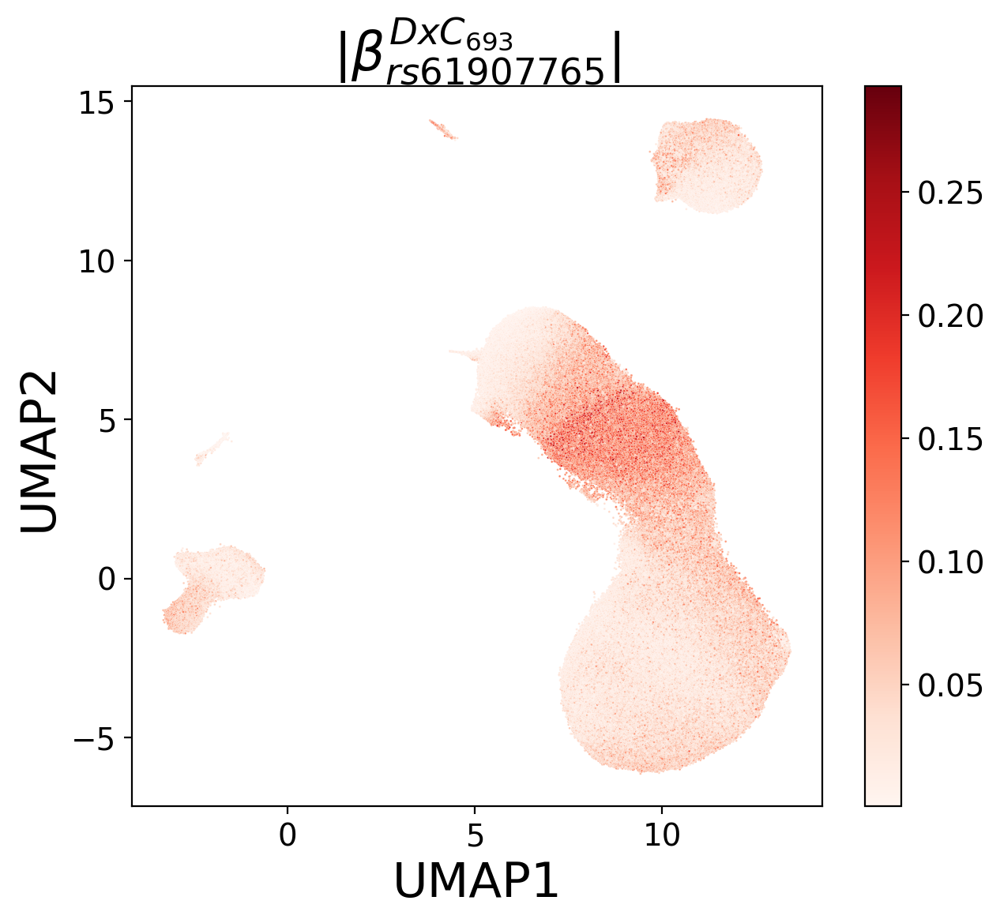

In [70]:
# Absolute effect

comap = "Reds" # "afmhot"  "gist_heat"
norM = colors.Normalize(vmin=DxC_beta["DxC_Factor693"].abs().min(), vmax=DxC_beta["DxC_Factor693"].abs().max())

fig, axs = plt.subplots(figsize=(7,6))
sns.scatterplot(
    x="UMAP1",
    y="UMAP2",
    hue="DxC_Factor693",
    data=umap_cc.merge(DxC_beta.abs(), right_index=True, left_index=True),
    ax=axs,
    s=1,
    palette=comap,
    hue_norm=norM,
    rasterized=True,
    legend=False,
)

sm = cm.ScalarMappable(cmap=comap, norm=norM)
cb = plt.colorbar(sm, ax=axs)

axs.set_title(
    label=fr"$|\beta_{{{rsid}}}^{{DxC_{{693}}}}|$", fontdict={"fontsize": 24}, loc="center"
)
axs.xaxis.label.set_fontsize(22)
axs.yaxis.label.set_fontsize(22)

plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937_absolute-effect-on-cells_trans-fSNP_Reds-cmap.png"),
                         dpi=500, transparent=True, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937_absolute-effect-on-cells_trans-fSNP_Reds-cmap.pdf"),
                         dpi=800, transparent=True, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937_absolute-effect-on-cells_trans-fSNP_Reds-cmap.eps"),
                         dpi=600, transparent=True, bbox_inches="tight")

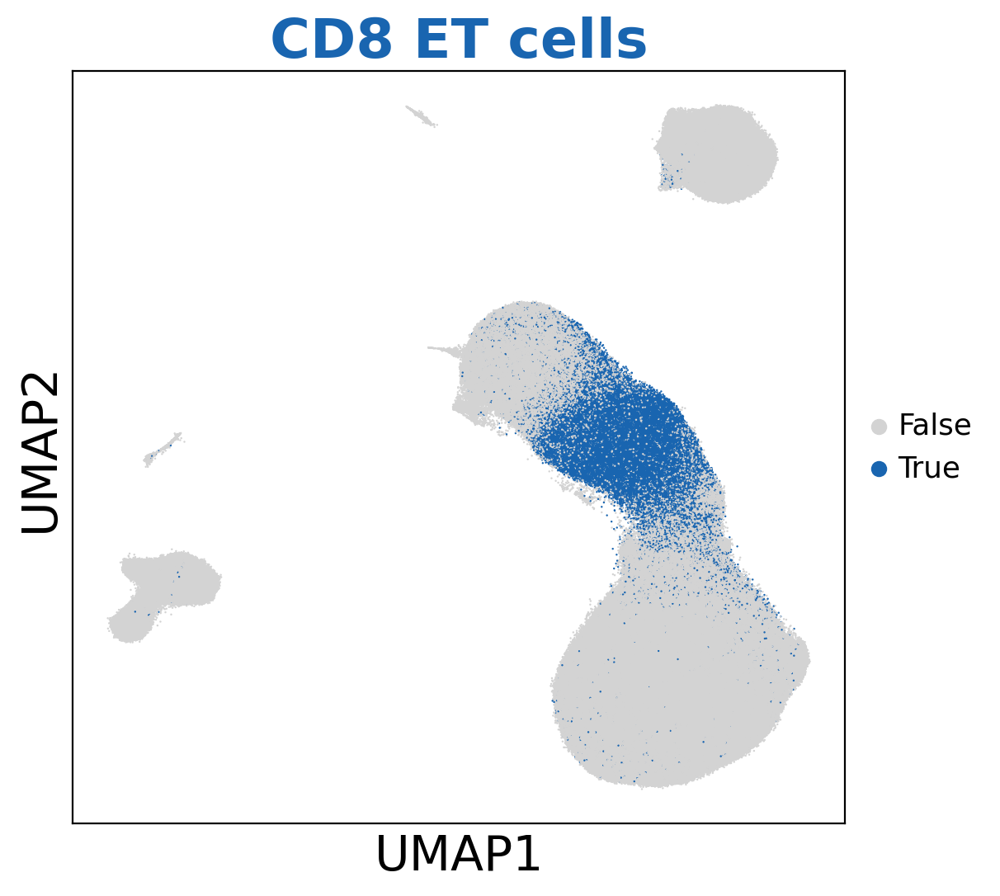

In [41]:
adata.obs = adata.obs.assign(cells2plot = [False]*adata.obs.shape[0])
adata.obs.loc[adata.obs.cell_label == "CD8 ET", "cells2plot"] = True

fig, axs = plt.subplots(figsize=(6,6))

sc.pl.umap(adata,
           color="cells2plot", 
           title="CD8 ET cells",
           size=3,
           palette=["lightgrey", cell_label_colors["CD8 ET"]],
           hspace=0.14,
           save=None,
           show=False,
           ax=axs)

axs.set_xlabel("UMAP1", fontsize=21)
axs.set_ylabel("UMAP2", fontsize=21)
axs.set_title(axs.get_title(), fontdict={"fontsize":24, "color":cell_label_colors["CD8 ET"], "weight":"bold"})

plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_UMAP-cell-state_CD8-ET-cells-highlighted.pdf"), 
            bbox_inches="tight", transparent=True, dpi=800)
plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_UMAP-cell-state_CD8-ET-cells-highlighted.png"), 
            bbox_inches="tight", transparent=True, dpi=400)


In [71]:
DxC_beta_ct = DxC_beta.abs().merge(adata.obs.cell_label, right_index=True, left_index=True)
DxC_beta_ct = DxC_beta_ct.groupby("cell_label", observed=True).apply(
    lambda x: x["DxC_Factor693"].mean(), include_groups=False
).rename("DxC_Factor693")

DxC_beta_ct

cell_label
B IN         0.032297
B Mem        0.049824
CD4 ET       0.040894
CD4 NC       0.042562
CD4 SOX4     0.036017
CD8 ET       0.129686
CD8 NC       0.056092
CD8 S100B    0.068454
DC           0.032261
Mono C       0.028466
Mono NC      0.063454
NK           0.054586
NK R         0.026455
Plasma       0.092676
Name: DxC_Factor693, dtype: float64

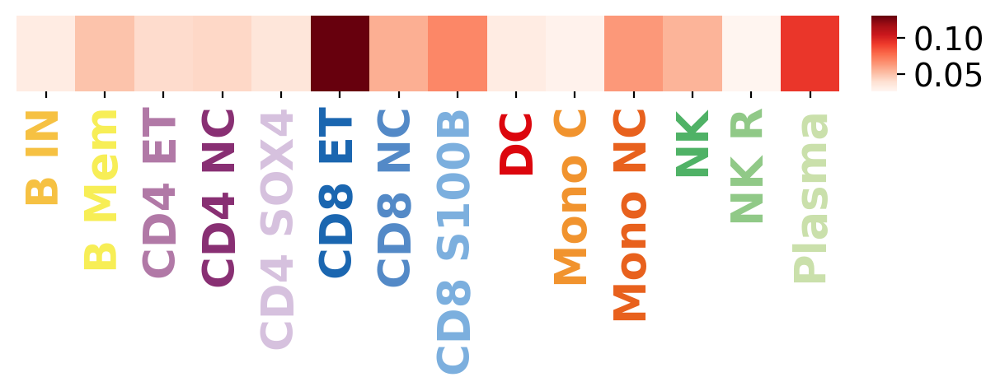

In [73]:
fig, axs = plt.subplots(figsize=(8,0.6))

sns.heatmap(DxC_beta_ct.to_frame().T, cmap="Reds", ax=axs, yticklabels=[], cbar_kws={"anchor":(-0.15,0.5), "aspect":3})
# axs.set_ylabel(fr"$GxC693_{{\beta_{{{rsid}}}}}$")
axs.set_xlabel("")
axs.xaxis.label.set_fontsize(23)
axs.tick_params(axis="x", length=3)
for j, label in enumerate(axs.get_xticklabels()):
    label.set_color(cell_label_colors[label.get_text()])
    label.set_fontweight("bold")
    label.set_fontsize(19)

# # Add border for visual clarity
# for spine in axs.spines.values():
#     spine.set_visible(True)
#     spine.set_edgecolor("#ededed")
#     spine.set_linewidth(1)
    
plt.savefig(os.path.join(model_results_dir, "Figures", "DxC693_absolute-effect-SNP-11-128391937_celltype_heatmap_trans-fSNP_Reds-cmap.pdf"), 
            bbox_inches="tight", transparent=True, dpi=600)
plt.savefig(os.path.join(model_results_dir, "Figures", "DxC693_absolute-effect-SNP-11-128391937_celltype_heatmap_trans-fSNP_Reds-cmap.png"), 
            bbox_inches="tight", transparent=True, dpi=600)
plt.savefig(os.path.join(model_results_dir, "Figures", "DxC693_absolute-effect-SNP-11-128391937_celltype_heatmap_trans-fSNP_Reds-cmap.eps"), 
            bbox_inches="tight", transparent=True, dpi=600)


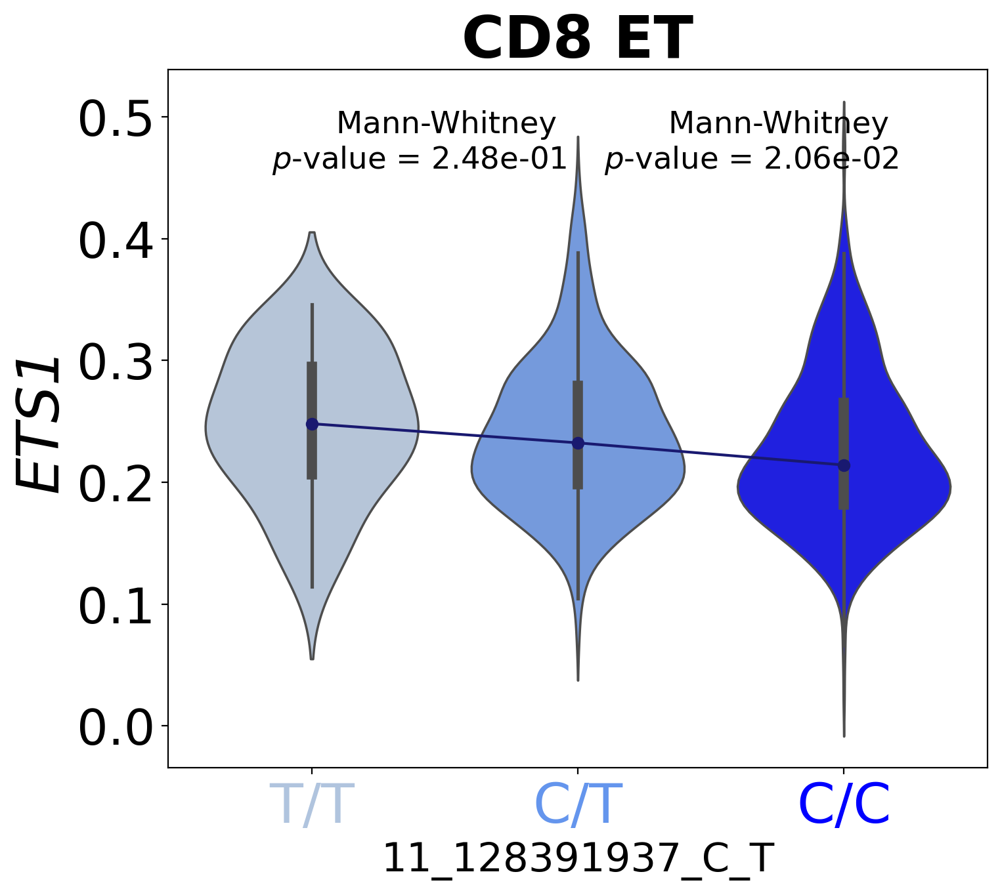

In [24]:
# cis TF gene

plot_ct_gex_vs_gt(
    adata=adata,
    gene="ENSG00000134954",
    filter_maf=False,
    annotation_fontsize=30,
    cell_indices=None,
    celltype=["CD8 ET"],
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["11:128391937"],
    DxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    format="png",
)

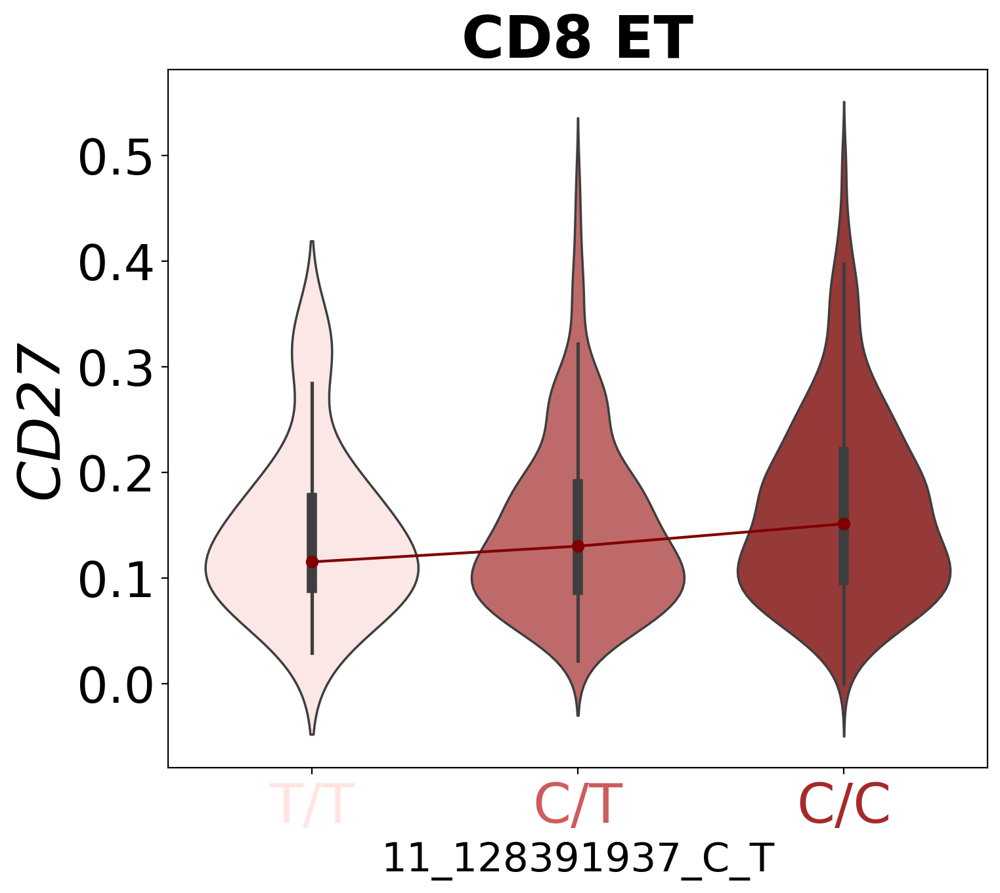

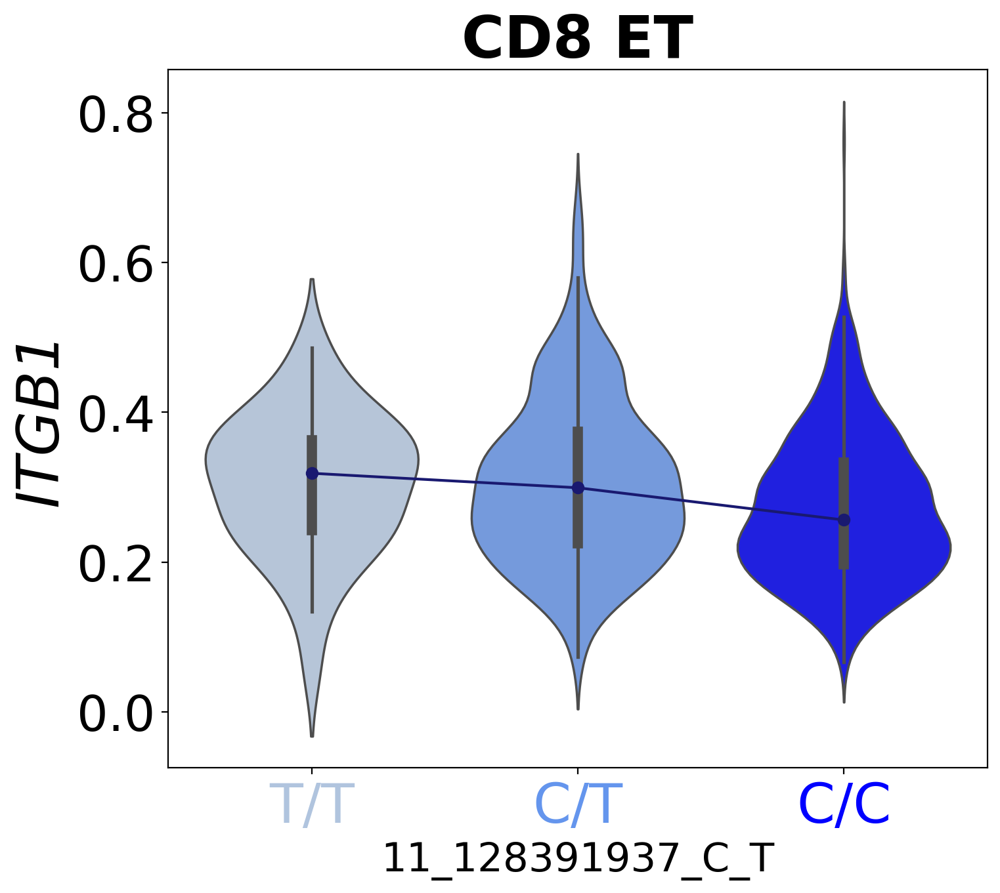

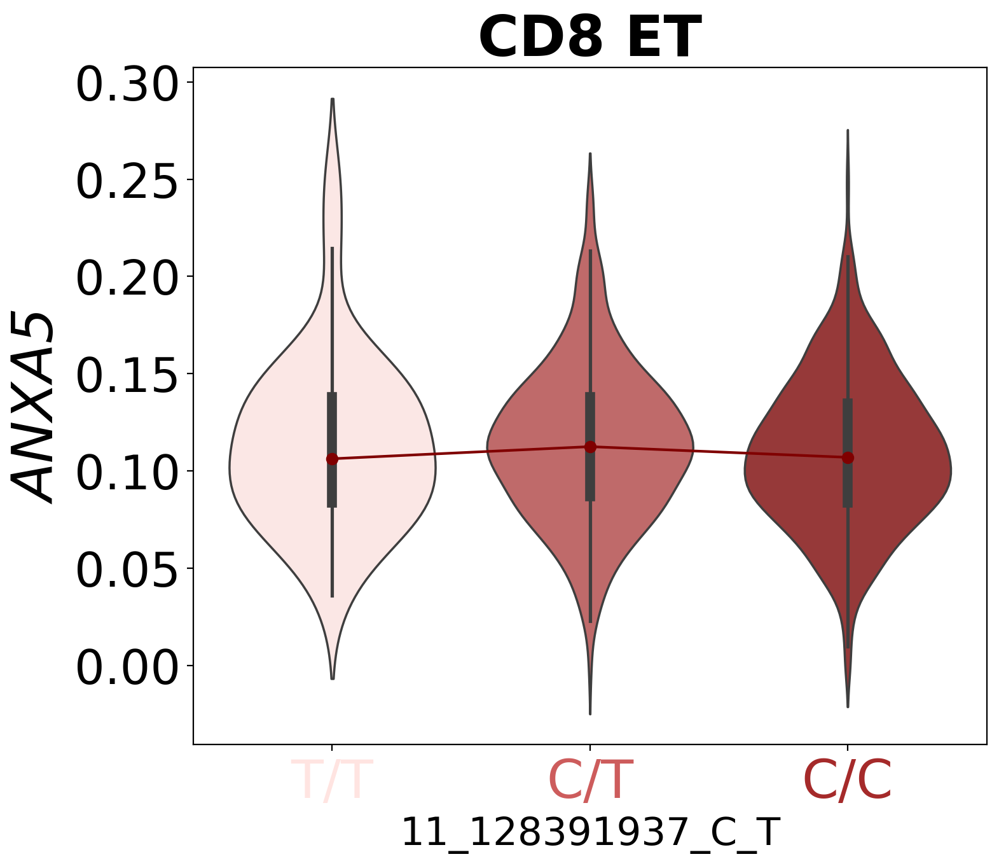

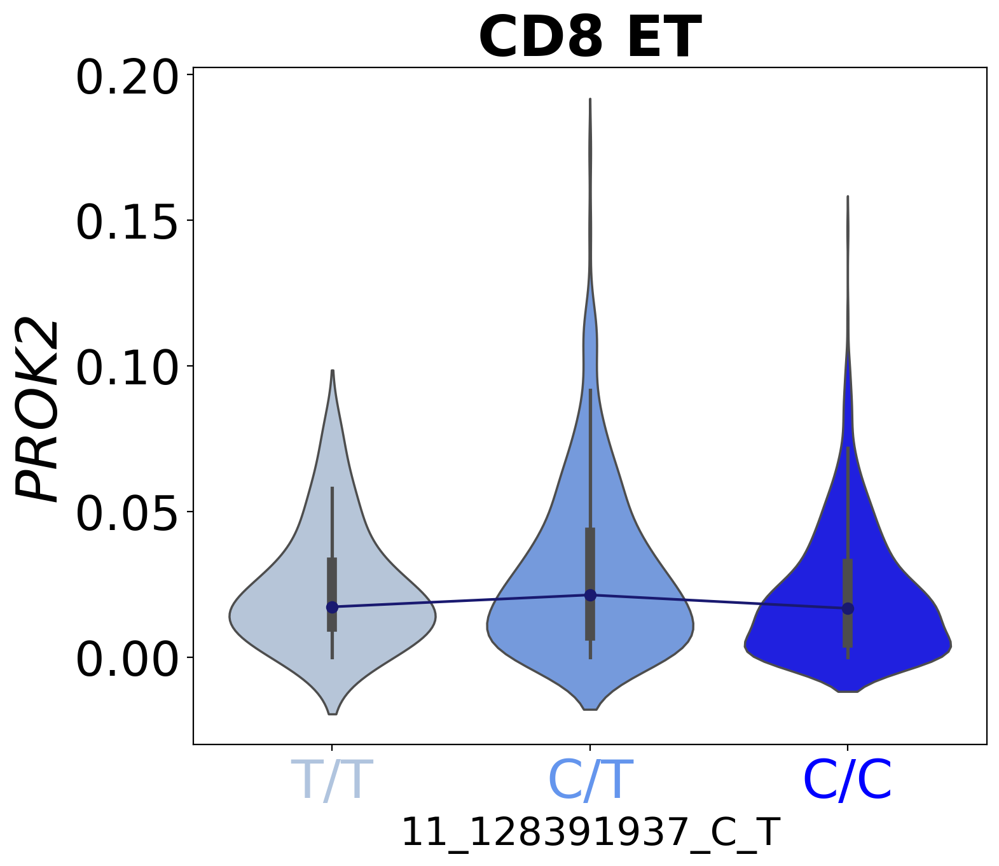

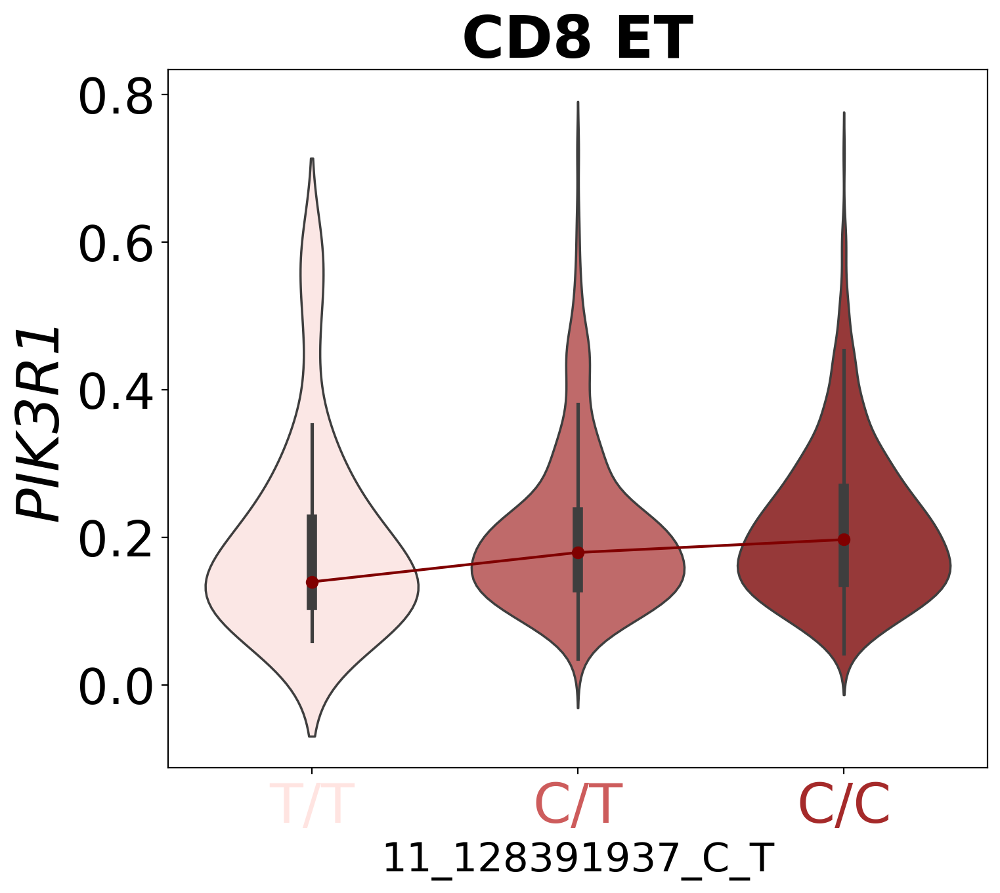

In [39]:
for g in adata.var.loc[adata.var.GeneSymbol.isin(
    enr_gxc_sign.loc[enr_gxc_sign.Term.str.contains("Negative Regulation Of Apoptotic Process")].Genes.iloc[0].split(";")
)].index:
    plot_ct_gex_vs_gt(
        adata=adata,
        gene=g,
        annotation_fontsize=30,
        cell_indices=None,
        filter_maf=False,
        test_gt_groups=False,
        celltype=["CD8 ET"],
        celltype_column="cell_label",
        iid_column="individual",
        GT_matrix=GT_matrix,
        SNP_id=SNP_dict_inv["11:128391937"],
        DxC_associations = GxC_effects,
        hgnc_column="GeneSymbol",
        savefig=True,
        output_dir=os.path.join(model_results_dir, "Figures"),
        output_prefix="WO_Mann-Whitney",
        format="pdf",
    )

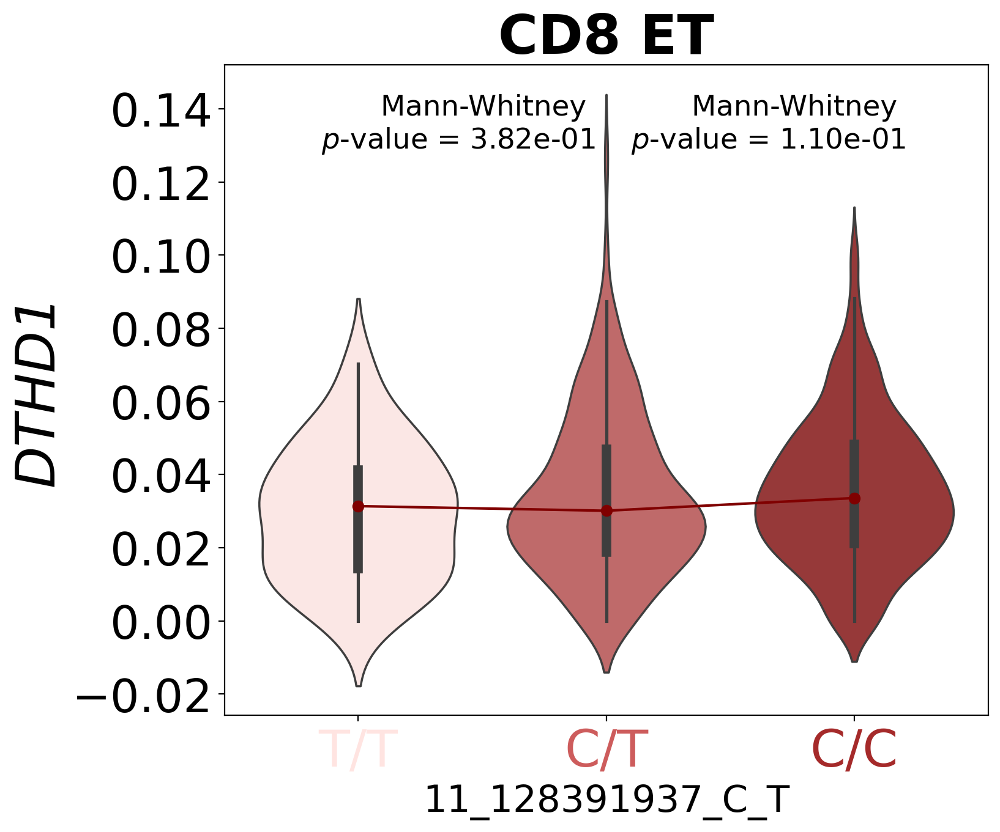

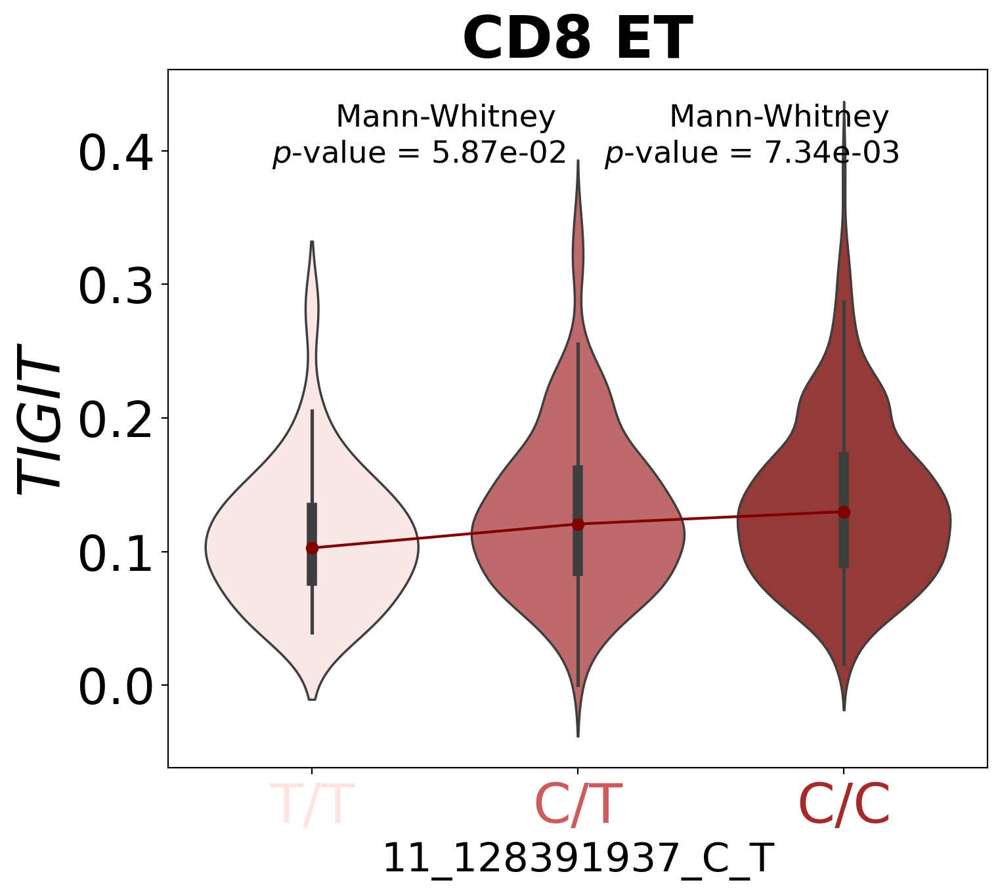

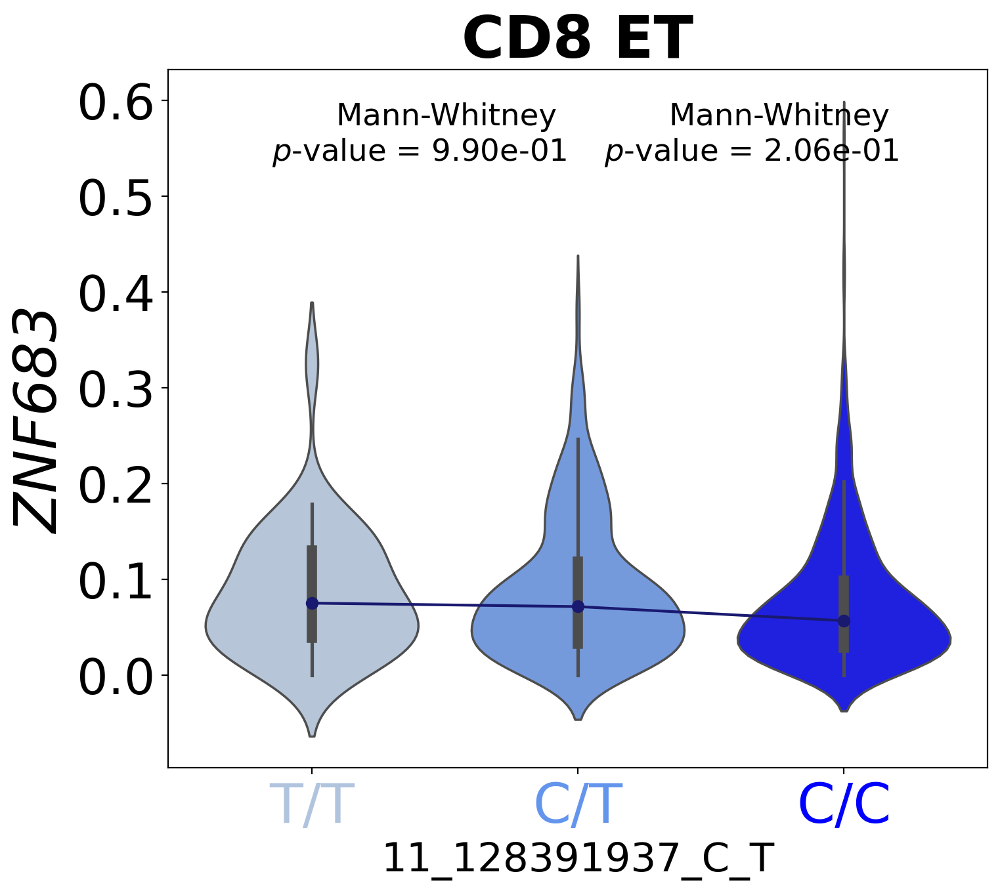

In [35]:
for g in replicating_genes:
    plot_ct_gex_vs_gt(
        adata=adata,
        gene=g,
        annotation_fontsize=30,
        cell_indices=None,
        filter_maf=False,
        test_gt_groups=True,
        celltype=["CD8 ET"],
        celltype_column="cell_label",
        iid_column="individual",
        GT_matrix=GT_matrix,
        SNP_id=SNP_dict_inv["11:128391937"],
        DxC_associations = GxC_effects,
        hgnc_column="GeneSymbol",
        savefig=True,
        output_dir=os.path.join(model_results_dir, "Figures"),
        format="pdf",
    )

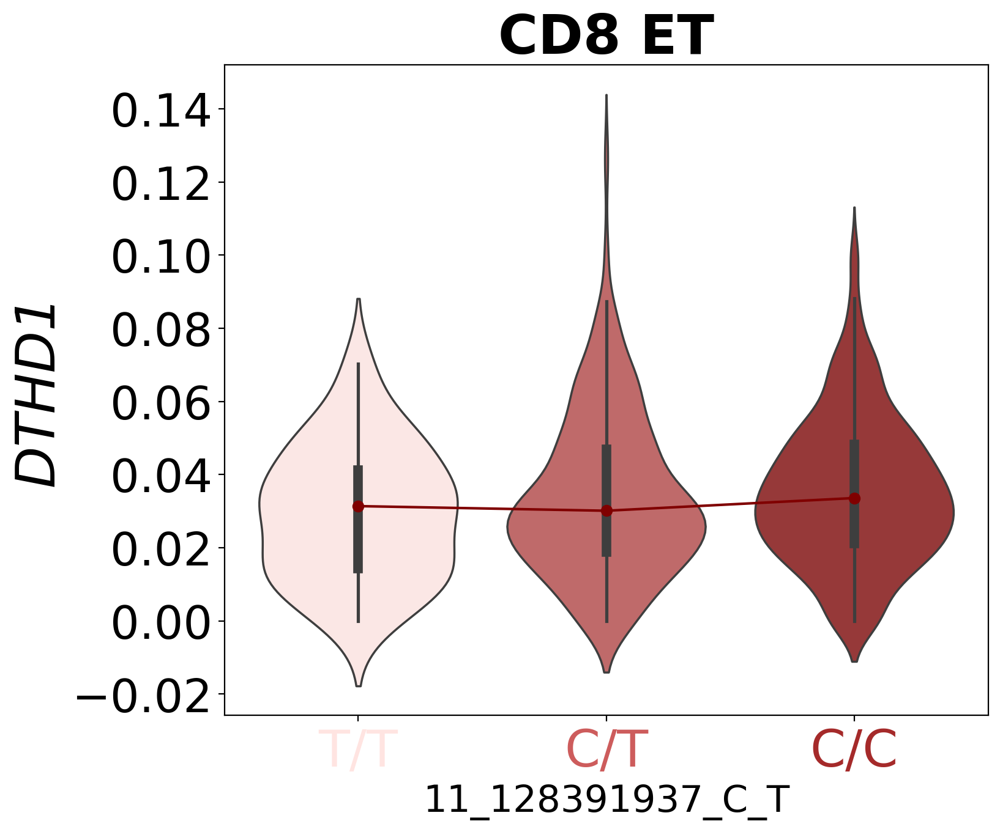

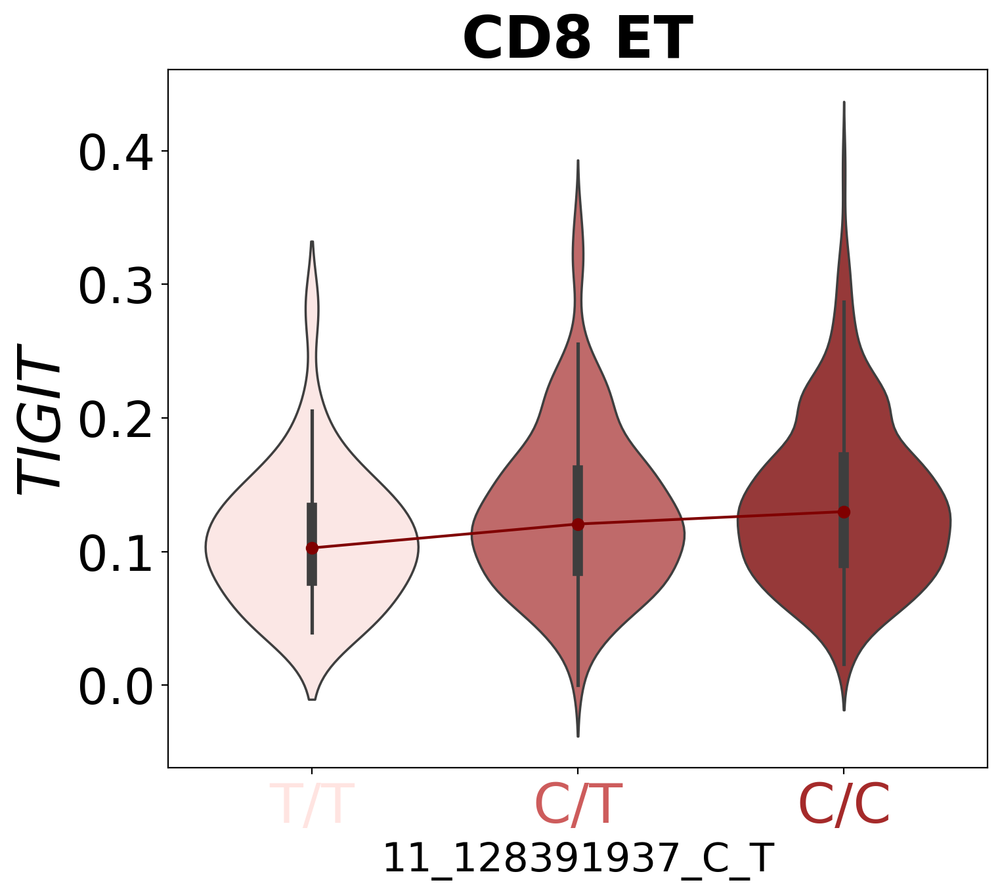

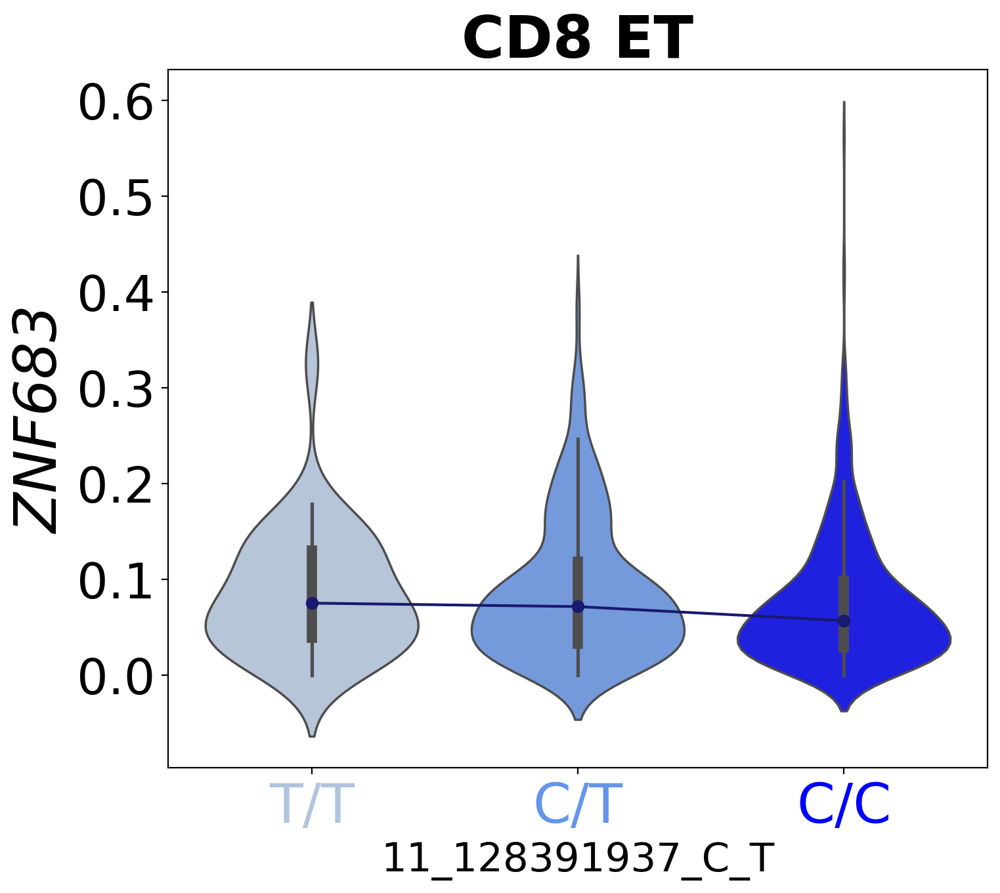

In [36]:
for g in replicating_genes:
    plot_ct_gex_vs_gt(
        adata=adata,
        gene=g,
        annotation_fontsize=30,
        cell_indices=None,
        filter_maf=False,
        test_gt_groups=False,
        celltype=["CD8 ET"],
        celltype_column="cell_label",
        iid_column="individual",
        GT_matrix=GT_matrix,
        SNP_id=SNP_dict_inv["11:128391937"],
        DxC_associations = GxC_effects,
        hgnc_column="GeneSymbol",
        savefig=True,
        output_dir=os.path.join(model_results_dir, "Figures"),
        output_prefix="WO_Mann-Whitney",
        format="png",
    )

/data/danai/scripts/LIVI/src/analysis/plotting.py:2484: UserWarning: Neither `cell_indices` nor `celltype` were provided.
Aggregating gene expression over all cells.
/data/danai/scripts/LIVI/src/analysis/plotting.py:2484: UserWarning: Neither `cell_indices` nor `celltype` were provided.
Aggregating gene expression over all cells.
/data/danai/scripts/LIVI/src/analysis/plotting.py:2484: UserWarning: Neither `cell_indices` nor `celltype` were provided.
Aggregating gene expression over all cells.


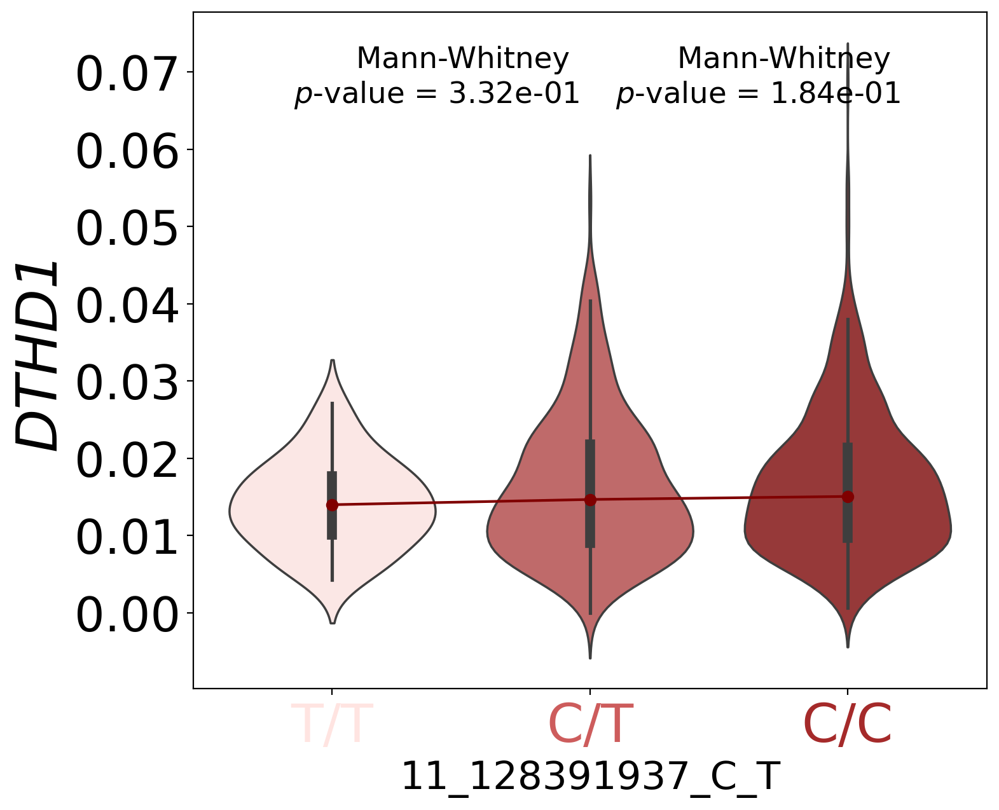

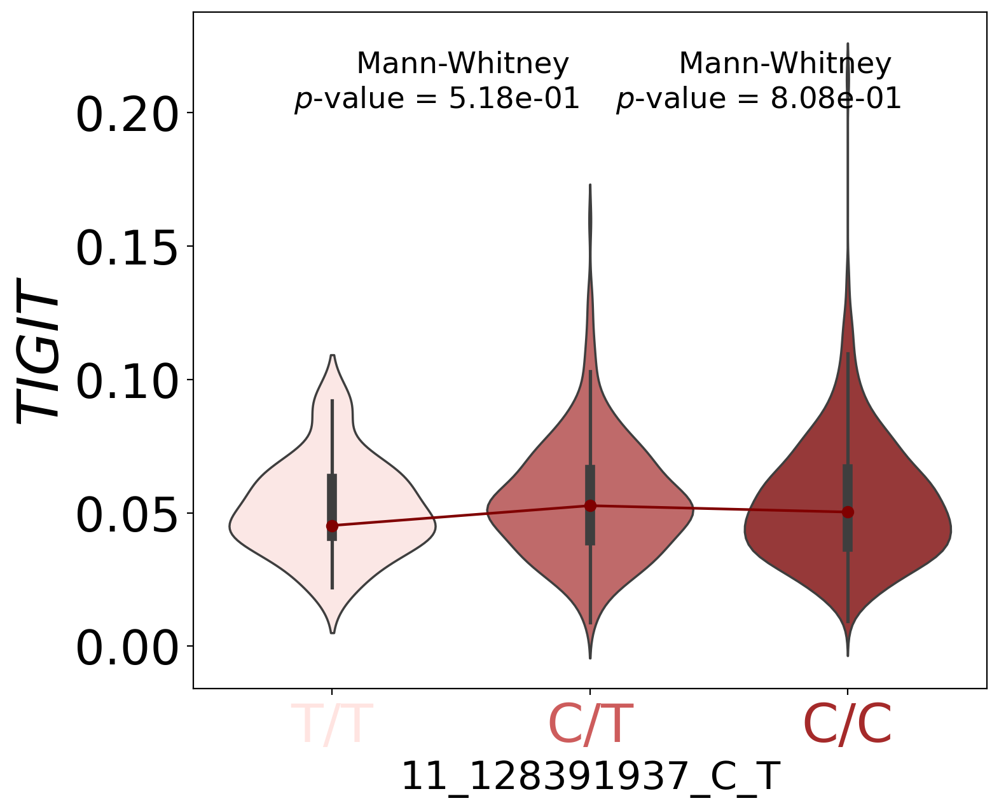

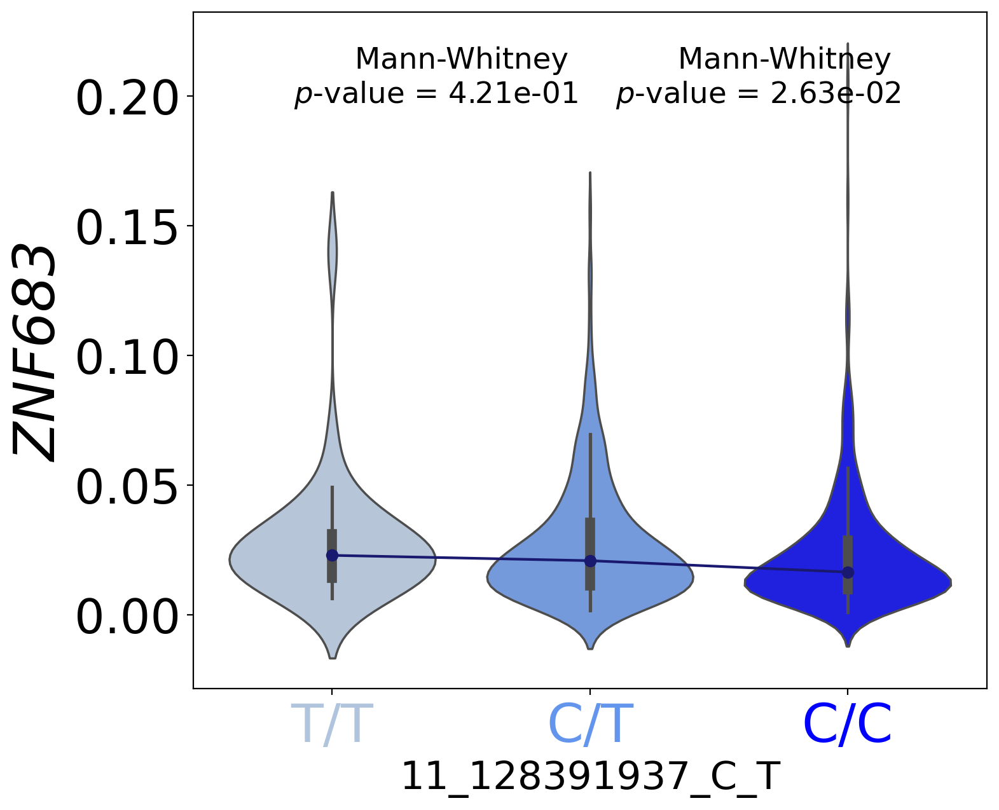

In [43]:
for g in replicating_genes:
    plot_ct_gex_vs_gt(
        adata=adata,
        gene=g,
        annotation_fontsize=30,
        cell_indices=None,
        filter_maf=False,
        test_gt_groups=True,
        celltype=None,
        celltype_column="cell_label",
        iid_column="individual",
        GT_matrix=GT_matrix,
        SNP_id=SNP_dict_inv["11:128391937"],
        DxC_associations = GxC_effects,
        hgnc_column="GeneSymbol",
        savefig=True,
        output_dir=os.path.join(model_results_dir, "Figures"),
        output_prefix="All-cells",
        format="pdf",
    )

In [45]:
effect_on_genes = calculate_DxC_gene_effect(
    DxC_associations = GxC_effects,
    SNP_id = SNP_dict_inv["11:128391937"],
    cell_state_latent = cell_state,
    A = assignment_matrix,
    DxC_decoder = DxC_decoder.loc[DxC_decoder["DxC_Factor693"].abs().nlargest(28).index],
    factor_id = "D_Factor693"
)
effect_on_genes = effect_on_genes.merge(adata.obs.cell_label, right_index=True, left_index=True)
effect_on_genes.head()

,ENSG00000176083,ENSG00000150093,ENSG00000187118,ENSG00000181847,ENSG00000206560,ENSG00000198848,ENSG00000169442,ENSG00000115738,ENSG00000150045,ENSG00000145675,...,ENSG00000134308,ENSG00000134107,ENSG00000143774,ENSG00000136213,ENSG00000124172,ENSG00000138326,ENSG00000030419,ENSG00000139193,ENSG00000069667,cell_label
barcode,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGAATGTTG-1,-0.008836,-0.005111,0.005085,0.004412,-0.004148,-0.003521,-0.003334,-0.003256,0.002918,0.002817,...,-0.002157,-0.002124,0.002020,-0.002001,0.001969,-0.001941,0.001938,0.001886,-0.001877,CD4 ET
AAACCTGAGAGAACAG-1,-0.013934,-0.008060,0.008019,0.006958,-0.006541,-0.005552,-0.005257,-0.005135,0.004602,0.004443,...,-0.003401,-0.003350,0.003185,-0.003155,0.003105,-0.003061,0.003056,0.002974,-0.002960,NK
AAACCTGAGCATGGCA-1,-0.009737,-0.005632,0.005604,0.004862,-0.004571,-0.003880,-0.003674,-0.003588,0.003216,0.003105,...,-0.002377,-0.002341,0.002226,-0.002205,0.002170,-0.002139,0.002136,0.002078,-0.002069,CD4 NC
AAACCTGAGTATTGGA-1,-0.012949,-0.007490,0.007452,0.006466,-0.006078,-0.005160,-0.004885,-0.004772,0.004276,0.004128,...,-0.003161,-0.003113,0.002960,-0.002932,0.002885,-0.002845,0.002840,0.002763,-0.002751,CD8 S100B
AAACCTGAGTGTCCCG-1,-0.027389,-0.015843,0.015762,0.013677,-0.012857,-0.010913,-0.010333,-0.010093,0.009045,0.008733,...,-0.006685,-0.006584,0.006260,-0.006202,0.006103,-0.006017,0.006008,0.005845,-0.005819,CD8 ET


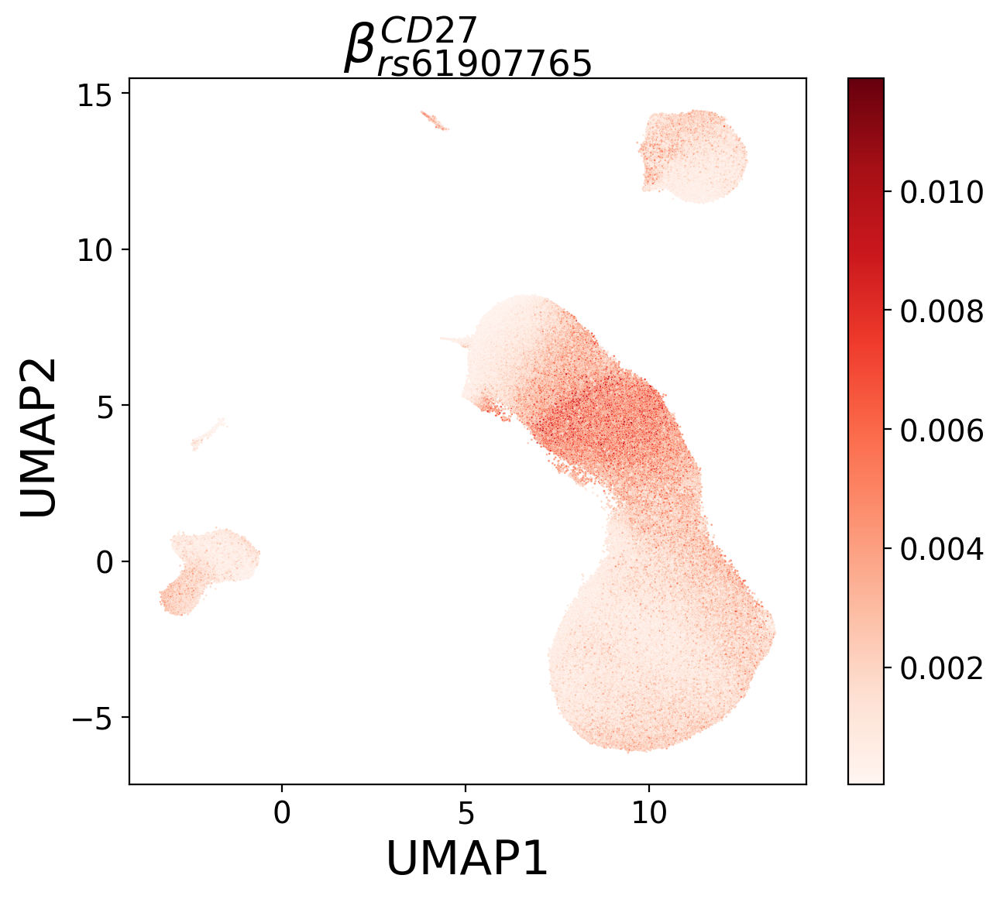

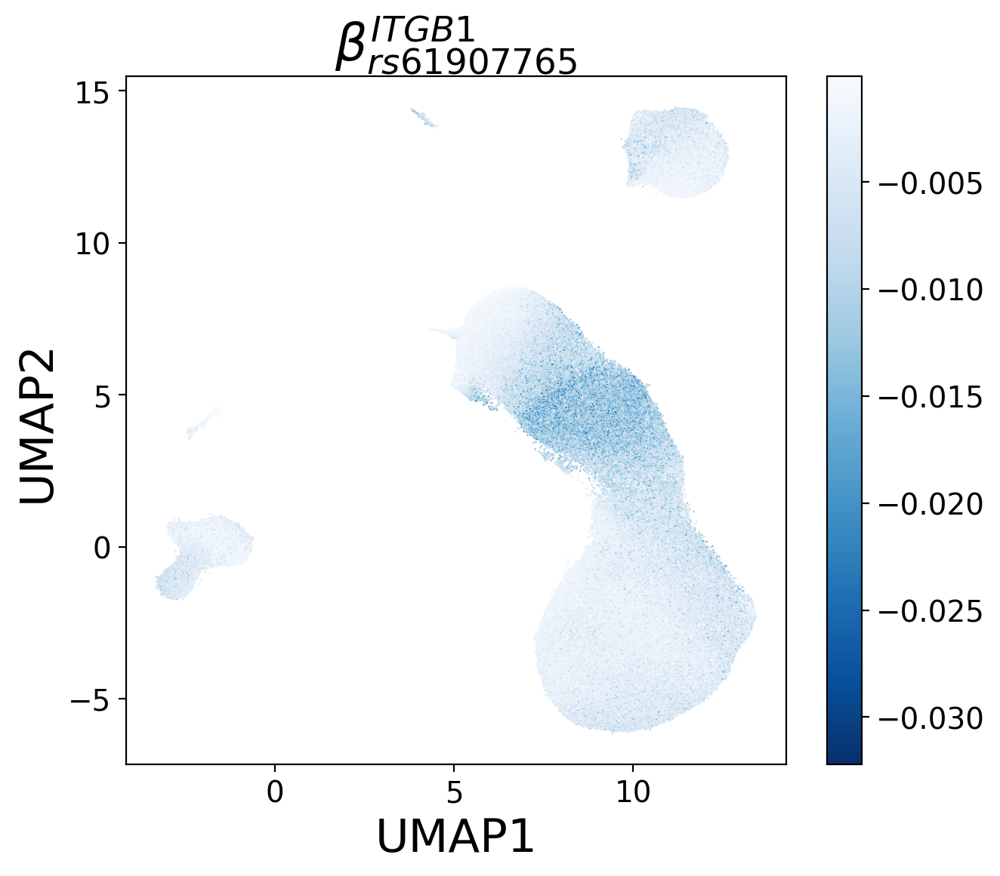

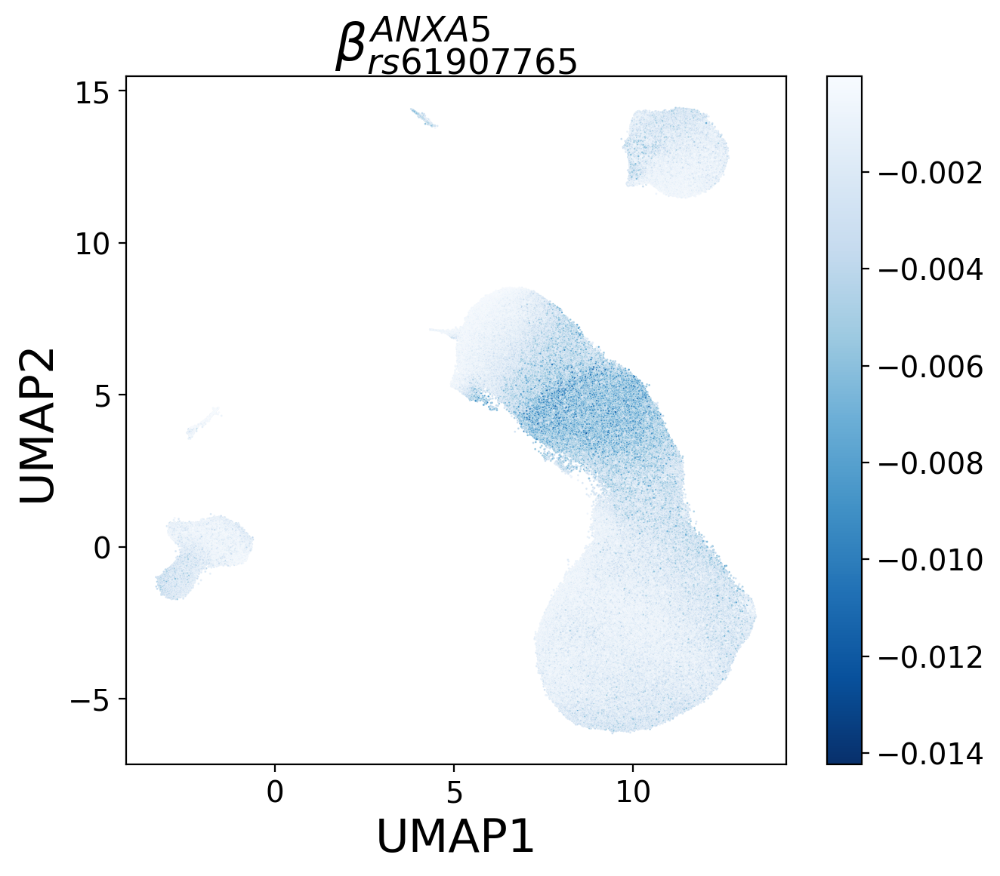

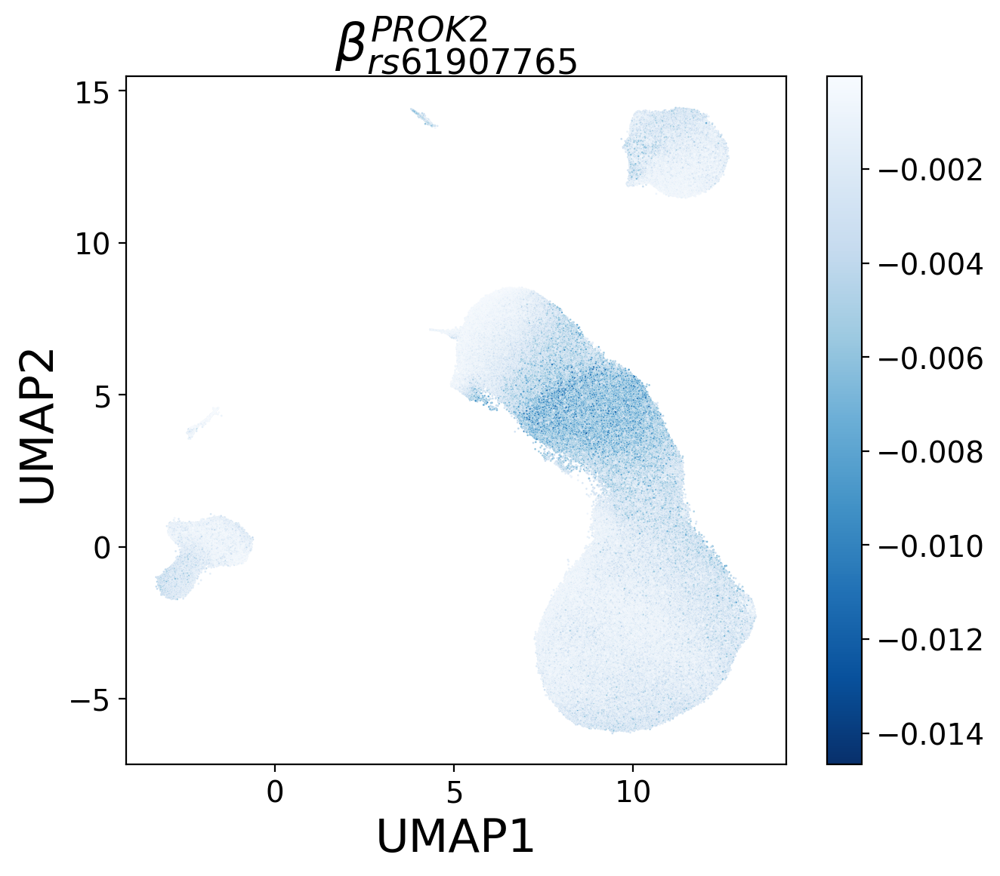

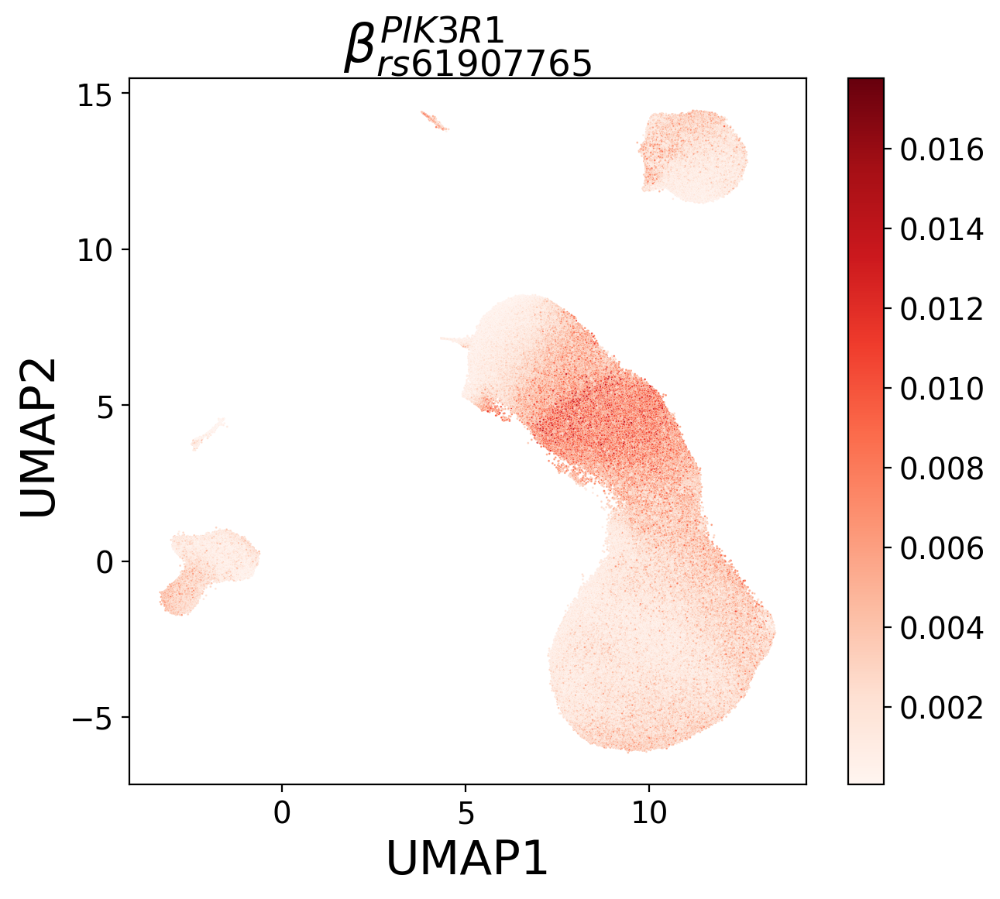

In [42]:
for g in adata.var.loc[adata.var.GeneSymbol.isin(
    enr_gxc_sign.loc[enr_gxc_sign.Term.str.contains("Negative Regulation Of Apoptotic Process")].Genes.iloc[0].split(";")
)].index:

    hgnc_name = adata.var.loc[g].GeneSymbol
    if effect_on_genes[g].min() < 0 and effect_on_genes[g].max() < 0:
        comap = "Blues_r"
    else:
        comap="Reds"
    
    fig, axs = plt.subplots(figsize=(7,6))
    sns.scatterplot(
        x="UMAP1",
        y="UMAP2",
        hue=g,
        data=umap_cc.merge(effect_on_genes[g], right_index=True, left_index=True),
        ax=axs,
        s=1,
        palette=comap,
        rasterized=True,
        legend=False,
    )

    norM = colors.Normalize(vmin=effect_on_genes[g].min(), vmax=effect_on_genes[g].max())
    sm = cm.ScalarMappable(
        cmap=comap,
        norm=norM
    )
    cb = plt.colorbar(sm, ax=axs)
    
    axs.set_title(
        label=fr"$\beta_{{{rsid}}}^{{{hgnc_name}}}$", fontdict={"fontsize": 24}, loc="center"
    )

    axs.set_xlabel("UMAP1", fontsize=22)
    axs.set_ylabel("UMAP2", fontsize=22)
    
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937-effect-on-{hgnc_name}_trans-fSNP.png"),
                dpi=600, transparent=True, bbox_inches="tight")
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937-effect-on-{hgnc_name}_trans-fSNP.pdf"),
                dpi=800, transparent=True, bbox_inches="tight")
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937-effect-on-{hgnc_name}_trans-fSNP.eps"),
                dpi=600, transparent=True, bbox_inches="tight")

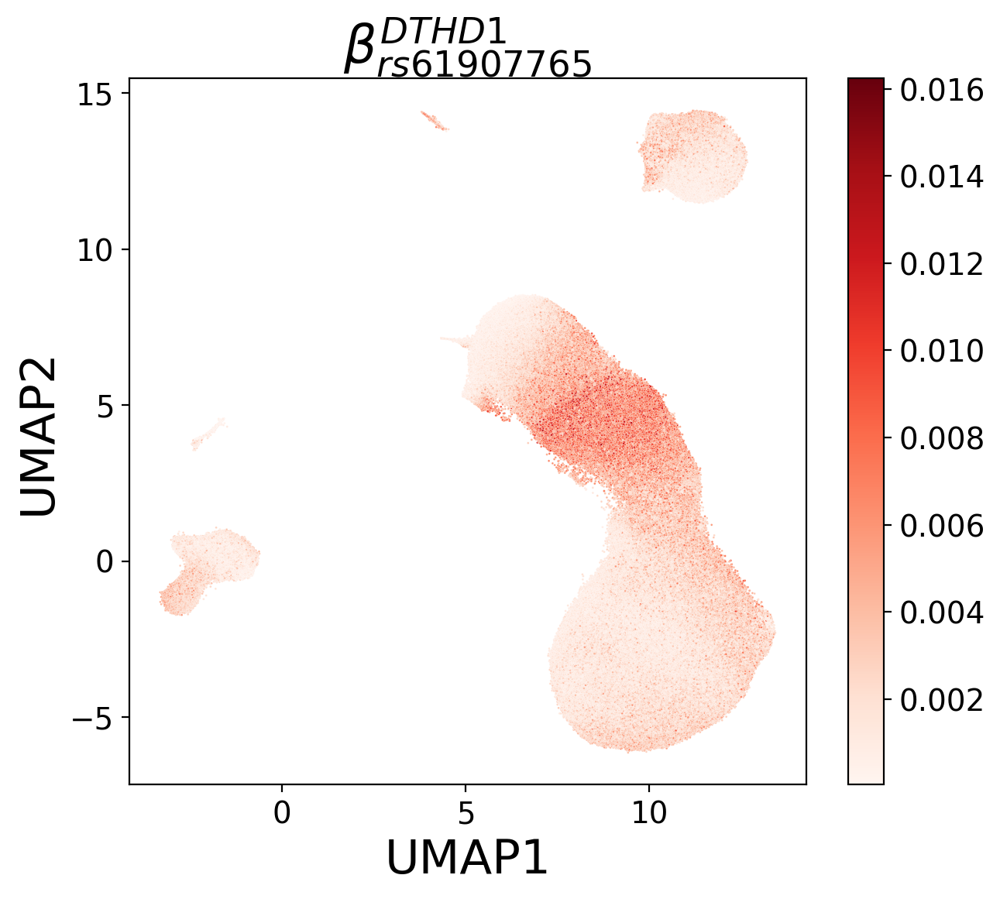

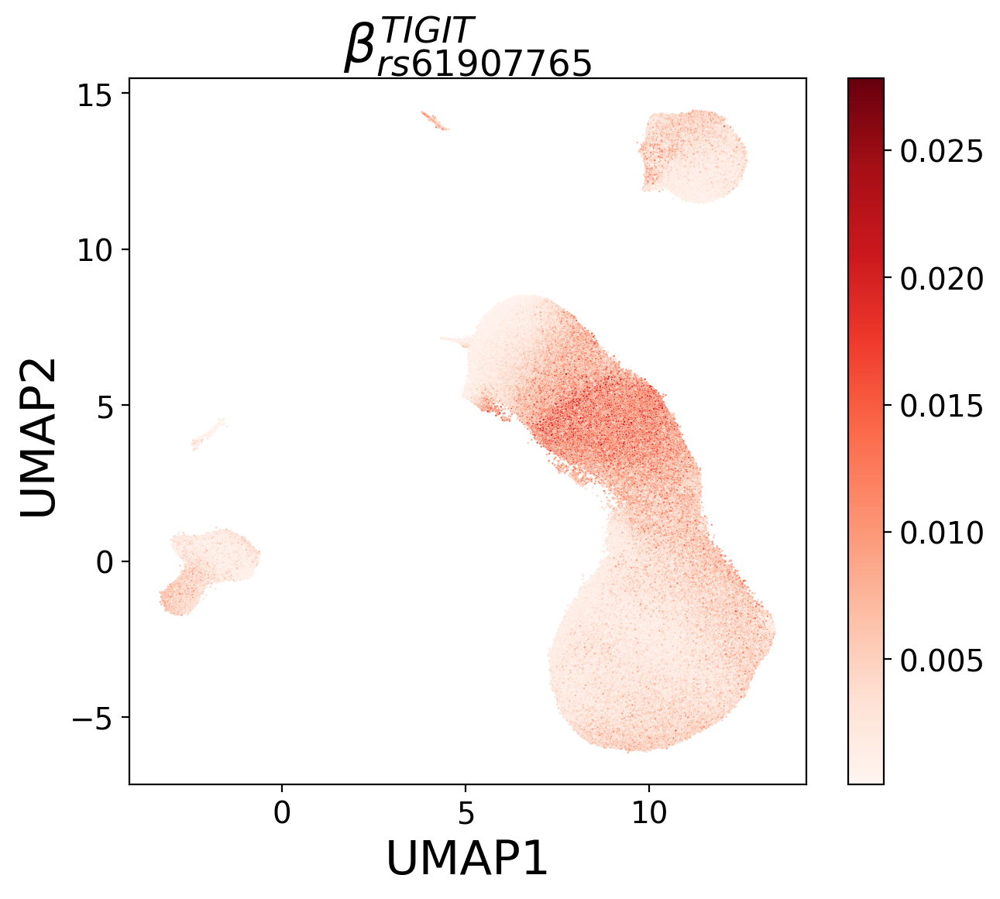

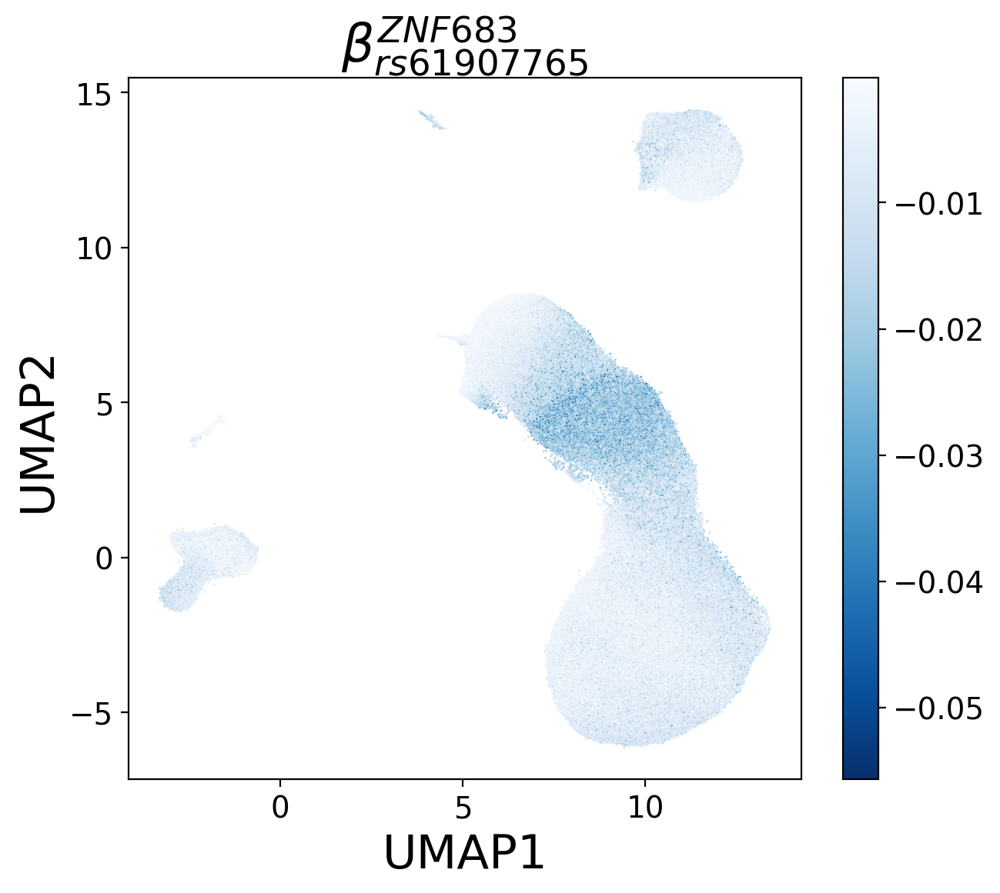

In [50]:
for g in replicating_genes:

    hgnc_name = adata.var.loc[g].GeneSymbol
    if effect_on_genes[g].min() < 0 and effect_on_genes[g].max() < 0:
        comap = "Blues_r"
    else:
        comap="Reds"
    
    fig, axs = plt.subplots(figsize=(7,6))
    sns.scatterplot(
        x="UMAP1",
        y="UMAP2",
        hue=g,
        data=umap_cc.merge(effect_on_genes[g], right_index=True, left_index=True),
        ax=axs,
        s=1,
        palette=comap,
        rasterized=True,
        legend=False,
    )

    norM = colors.Normalize(vmin=effect_on_genes[g].min(), vmax=effect_on_genes[g].max())
    sm = cm.ScalarMappable(
        cmap=comap,
        norm=norM
    )
    cb = plt.colorbar(sm, ax=axs)
    
    axs.set_title(
        label=fr"$\beta_{{{rsid}}}^{{{hgnc_name}}}$", fontdict={"fontsize": 24}, loc="center"
    )

    axs.set_xlabel("UMAP1", fontsize=22)
    axs.set_ylabel("UMAP2", fontsize=22)
    
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937-effect-on-{hgnc_name}_trans-fSNP.png"),
                dpi=600, transparent=True, bbox_inches="tight")
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937-effect-on-{hgnc_name}_trans-fSNP.pdf"),
                dpi=800, transparent=True, bbox_inches="tight")
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D693_SNP-11-128391937-effect-on-{hgnc_name}_trans-fSNP.eps"),
                dpi=600, transparent=True, bbox_inches="tight")

### Comparison to gene-level testing

In [22]:
tensorqtl_all_11_128391937 = pd.read_csv("/data/danai/Data/OneK1K/Benchmarks/TensorQTL/tensorqtl_results_all_11_128391937.tsv", 
                                       sep="\t", names=["SNP_id", "Gene", "p_value", "ref_allele", "alt_allele", "celltype", "eQTL"])
tensorqtl_all_11_128391937.head()

,SNP_id,Gene,p_value,ref_allele,alt_allele,celltype,eQTL
0,11:128391937,ENSG00000166987,0.417708,C,T,CD4-ET,11_128391937_C_T__ENSG00000166987__CD4-ET
1,11:128391937,ENSG00000170624,0.929398,C,T,CD4-ET,11_128391937_C_T__ENSG00000170624__CD4-ET
2,11:128391937,ENSG00000117115,0.570757,C,T,CD4-ET,11_128391937_C_T__ENSG00000117115__CD4-ET
3,11:128391937,ENSG00000137078,0.345729,C,T,CD4-ET,11_128391937_C_T__ENSG00000137078__CD4-ET
4,11:128391937,ENSG00000082213,0.556918,C,T,CD4-ET,11_128391937_C_T__ENSG00000082213__CD4-ET


In [23]:
tensorqtl_all_11_128391937 = tensorqtl_all_11_128391937.set_index("Gene").merge(
    adata.var.GeneSymbol, right_index=True, left_index=True, how="left").reset_index()
tensorqtl_all_11_128391937 = tensorqtl_all_11_128391937.assign(mlog10_pval = -np.log10(tensorqtl_all_11_128391937.p_value))
tensorqtl_all_11_128391937.head()

,Gene,SNP_id,p_value,ref_allele,alt_allele,celltype,eQTL,GeneSymbol,mlog10_pval
0,ENSG00000166987,11:128391937,0.417708,C,T,CD4-ET,11_128391937_C_T__ENSG00000166987__CD4-ET,MBD6,0.379127
1,ENSG00000170624,11:128391937,0.929398,C,T,CD4-ET,11_128391937_C_T__ENSG00000170624__CD4-ET,SGCD,0.031798
2,ENSG00000117115,11:128391937,0.570757,C,T,CD4-ET,11_128391937_C_T__ENSG00000117115__CD4-ET,PADI2,0.243549
3,ENSG00000137078,11:128391937,0.345729,C,T,CD4-ET,11_128391937_C_T__ENSG00000137078__CD4-ET,SIT1,0.461264
4,ENSG00000082213,11:128391937,0.556918,C,T,CD4-ET,11_128391937_C_T__ENSG00000082213__CD4-ET,C5orf22,0.254209


In [24]:
tensorqtl_11_128391937_CD8_ET = tensorqtl_all_11_128391937.loc[tensorqtl_all_11_128391937.celltype == "CD8-ET"]
tensorqtl_11_128391937_CD8_ET.shape

(12617, 9)

In [25]:
tensorqtl_11_128391937_CD8_ET.loc[(tensorqtl_11_128391937_CD8_ET.Gene.isin(DxC_decoder["DxC_Factor693"].abs().nlargest(28).index)) &
(tensorqtl_11_128391937_CD8_ET.p_value < 0.05)]

,Gene,SNP_id,p_value,ref_allele,alt_allele,celltype,eQTL,GeneSymbol,mlog10_pval
50717,ENSG00000139193,11:128391937,0.024713,C,T,CD8-ET,11_128391937_C_T__ENSG00000139193__CD8-ET,CD27,1.607081
54420,ENSG00000150093,11:128391937,0.009168,C,T,CD8-ET,11_128391937_C_T__ENSG00000150093__CD8-ET,ITGB1,2.037726
58434,ENSG00000181847,11:128391937,0.007240,C,T,CD8-ET,11_128391937_C_T__ENSG00000181847__CD8-ET,TIGIT,2.140239
60221,ENSG00000163421,11:128391937,0.005873,C,T,CD8-ET,11_128391937_C_T__ENSG00000163421__CD8-ET,PROK2,2.231177
62195,ENSG00000169442,11:128391937,0.022256,C,T,CD8-ET,11_128391937_C_T__ENSG00000169442__CD8-ET,CD52,1.652561


In [26]:
tensorqtl_11_128391937_other_cells = tensorqtl_all_11_128391937.loc[tensorqtl_all_11_128391937.celltype != "CD8-ET"]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


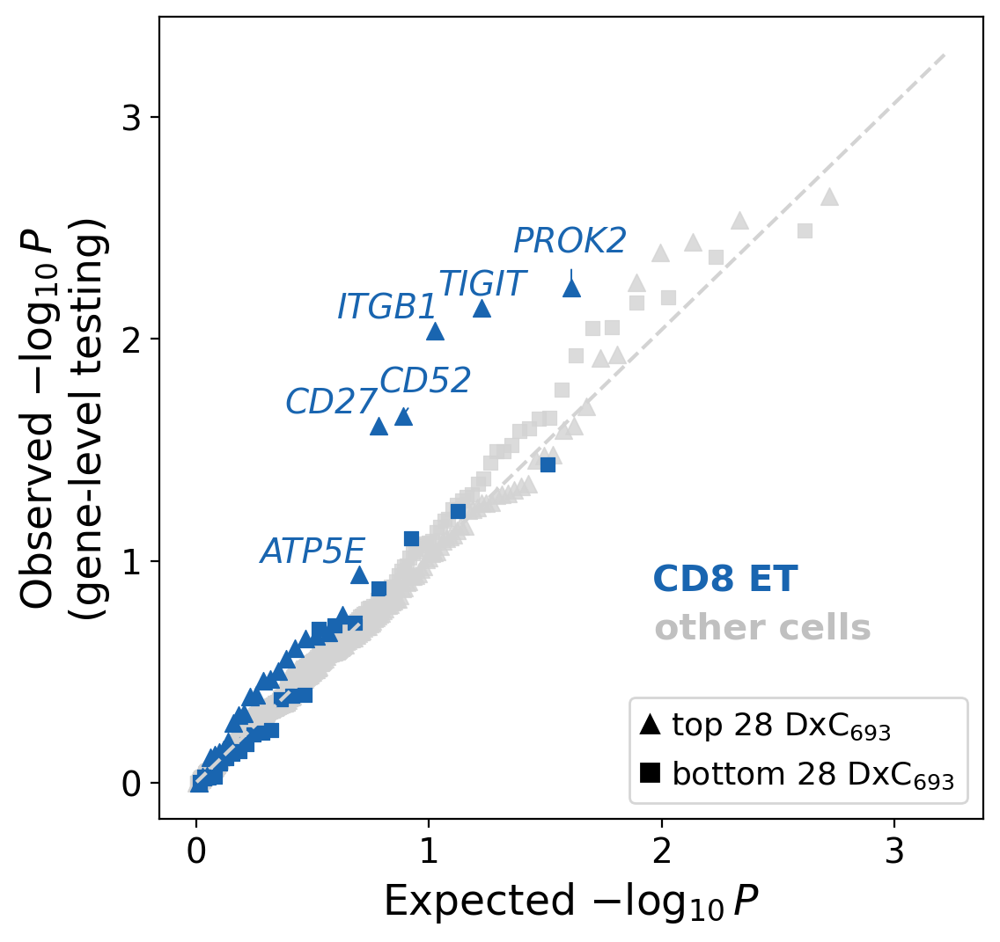

In [27]:
# Select LIVI's top 28 genes in CD8 ET
tmp = tensorqtl_11_128391937_CD8_ET.loc[tensorqtl_11_128391937_CD8_ET.Gene.isin(DxC_decoder["DxC_Factor693"].abs().nlargest(28).index)]
(osm, osr), _ = probplot(tmp.p_value, dist="uniform")
x_top28_CD8ET = -np.log10(osm)
y_top28_CD8ET = -np.log10(osr)

# Get indices of top LIVI genes to annotate
tmp_anno = tmp.loc[tmp.mlog10_pval >= 0.8].GeneSymbol.to_dict() # index, gene name
# Get p-value sorted indices of the original indices
top_CD8ET_anno = {}
for k,v in tmp_anno.items():
    top_CD8ET_anno[v] = tmp.p_value.sort_values(ascending=True).index.get_loc(k)


# Bottom 28 genes in CD8 ET
(osm, osr), _ = probplot(tensorqtl_11_128391937_CD8_ET.loc[tensorqtl_11_128391937_CD8_ET.Gene.isin(DxC_decoder["DxC_Factor693"].abs().nsmallest(28).index)].p_value, 
                         dist="uniform")
x_bottom28_CD8ET = -np.log10(osm)
y_bottom28_CD8ET = -np.log10(osr)


# Select LIVI's top 28 genes in other cells
tmp = tensorqtl_11_128391937_other_cells.loc[tensorqtl_11_128391937_other_cells.Gene.isin(DxC_decoder["DxC_Factor693"].abs().nlargest(28).index)]
(osm, osr), _ = probplot(tmp.p_value, dist="uniform")
x_top28_other = -np.log10(osm)
y_top28_other = -np.log10(osr)

# Get indices of top LIVI genes to annotate
tmp_anno = tmp.loc[tmp.mlog10_pval >= 1]
# For each gene get the min p-value across other celltypes
gene_min_pval = tmp_anno.groupby("GeneSymbol", observed=True).apply(lambda x: x.p_value.min(), include_groups=False).rename("p_value").to_frame()
idx = []
geneS = []
for _, row in gene_min_pval.reset_index().iterrows():  
    idx.extend(
        tensorqtl_11_128391937_other_cells.loc[
        (tensorqtl_11_128391937_other_cells.GeneSymbol == row["GeneSymbol"]) & 
        (tensorqtl_11_128391937_other_cells.p_value == row["p_value"])
        ].index.tolist()
    )
    geneS.append(row["GeneSymbol"])
top_other_anno = dict(zip(geneS, idx))
# Get p-value sorted indices of the original indices
for k,v in top_other_anno.items():
    top_other_anno[k] = tmp.p_value.sort_values(ascending=True).index.get_loc(v)

# Bottom 28 genes in other cells
(osm, osr), _ = probplot(tensorqtl_11_128391937_other_cells.loc[tensorqtl_11_128391937_other_cells.Gene.isin(DxC_decoder["DxC_Factor693"].abs().nsmallest(28).index)].p_value, 
                         dist="uniform")
x_bottom28_other = -np.log10(osm)
y_bottom28_other = -np.log10(osr)


# Determine a common x-axis end (max x across all)
common_x_end = max(x_top28_CD8ET.max(), x_top28_other.max(), x_bottom28_CD8ET.max(), x_bottom28_other.max())

plt.figure(figsize=(6,6))
axs = plt.gca()

# Add a diagonal line
b, a_fit = np.polyfit(x_top28_other, y_top28_other, deg=1)
x_line = np.linspace(0, common_x_end + 0.5, 100)
axs.plot(x_line, a_fit + b * x_line, c="lightgrey", linestyle="--")

sns.scatterplot(x=x_top28_other, y=y_top28_other, ax=axs, edgecolor=None, color="lightgrey", s=50, marker="^", 
                alpha=0.8, label="other cells")
sns.scatterplot(x=x_bottom28_other, y=y_bottom28_other, ax=axs, edgecolor=None, color="lightgrey", s=30, marker="s",
                alpha=0.8, label="other cells")
sns.scatterplot(x=x_top28_CD8ET, y=y_top28_CD8ET, ax=axs, edgecolor=None, color=cell_label_colors["CD8 ET"],
                s=50, marker="^", label="CD8T effector") 
sns.scatterplot(x=x_bottom28_CD8ET, y=y_bottom28_CD8ET, ax=axs, edgecolor=None, color=cell_label_colors["CD8 ET"],
                s=30, marker="s", label="CD8T effector")


# Add gene annotations

for k,v in top_CD8ET_anno.items():
    if k == "PROK2":
        axs.annotate(
            text=k,
            xy=(x_top28_CD8ET[v], y_top28_CD8ET[v]),
            xytext=(x_top28_CD8ET[v], y_top28_CD8ET[v]+0.2),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD8 ET"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            color=cell_label_colors["CD8 ET"]
        )
    elif k == "TIGIT":
         axs.annotate(
            text=k,
            xy=(x_top28_CD8ET[v], y_top28_CD8ET[v]),
            xytext=(x_top28_CD8ET[v], y_top28_CD8ET[v]+0.1),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD8 ET"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            color=cell_label_colors["CD8 ET"]
        )
    elif k == "CD52":
         axs.annotate(
            text=k,
            xy=(x_top28_CD8ET[v], y_top28_CD8ET[v]),
            xytext=(x_top28_CD8ET[v]+0.1, y_top28_CD8ET[v]+0.15),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD8 ET"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            color=cell_label_colors["CD8 ET"]
        )
    elif k == "CD160":
         axs.annotate(
            text=k,
            xy=(x_top28_CD8ET[v], y_top28_CD8ET[v]),
            xytext=(x_top28_CD8ET[v]-0.2, y_top28_CD8ET[v]-0.2),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD8 ET"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            color=cell_label_colors["CD8 ET"]
        )
    else:
        axs.annotate(
            text=k,
            xy=(x_top28_CD8ET[v], y_top28_CD8ET[v]),
            xytext=(x_top28_CD8ET[v]-0.2, y_top28_CD8ET[v]+0.1),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD8 ET"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            color=cell_label_colors["CD8 ET"]
        )

# for k,v in top_other_anno.items():
#     if y_top30_other[v] > 1.3:
#         axs.annotate(
#             text=k,
#             xy=(x_top30_other[v], y_top30_other[v]),
#             xytext=(x_top30_other[v]+0.2, y_top30_other[v]+0.1),
#             arrowprops=dict(
#                 arrowstyle="-",
#                 connectionstyle="arc3",
#                 color="bisque",
#                 linewidth=0.7,
#             ),
#             ha="left",
#             va="center",
#             fontstyle="italic",
#             color="bisque"
#         )
#     else:
#         axs.annotate(
#             text=k,
#             xy=(x_top30_other[v], y_top30_other[v]),
#             xytext=(x_top30_other[v]+0.3, y_top30_other[v]),
#             arrowprops=dict(
#                 arrowstyle="-",
#                 connectionstyle="arc3",
#                 color="bisque",
#                 linewidth=0.7,
#             ),
#             ha="left",
#             va="top",
#             fontstyle="italic",
#             color="bisque"
#         )


axs.set(xlabel=r"Expected $-\log_{10} P$", ylabel=r"Observed $-\log_{10} P$"+"\n(gene-level testing)")
axs.xaxis.label.set_size(17)
axs.yaxis.label.set_size(17)
axs.set_yticks(np.arange(0, axs.get_xticks().max(),1))
axs.set_xticks(np.arange(0, axs.get_xticks().max(),1))

legend = axs.legend(handles=[], title="CD8 ET", title_fontsize=15, loc="lower right", frameon=False,
                     bbox_to_anchor=(0.81, 0.22), alignment="left")
legend.get_title().set_color(cell_label_colors["CD8 ET"])
legend.get_title().set_fontweight("bold")
axs.add_artist(legend)


legend2 = axs.legend(handles=[], title="other cells", title_fontsize=15, loc="lower right", frameon=False, 
                     bbox_to_anchor=(0.9, 0.16), alignment="left")
legend2.get_title().set_color("silver")
legend2.get_title().set_fontweight("bold")
axs.add_artist(legend2)


legend_handles = [
    Line2D([], [], color="black", marker="^", linestyle="None", markersize=7, label="top 28 DxC$_{693}$"),
    Line2D([], [], color="black", marker="s", linestyle="None", markersize=7, label="bottom 28 DxC$_{693}$")
]
legend3 = axs.legend(handles=legend_handles, title="", title_fontsize=13, fontsize=13, loc="lower right", frameon=True, 
                     alignment="left")


# axs.set_yticks(np.arange(0, 6, 1), np.arange(0, 6, 1), fontsize=13)
# axs.set_xticks(np.arange(0, 6, 1), np.arange(0, 6, 1), fontsize=13)
# axs.set_xlim(0,4)

plt.savefig(os.path.join(model_results_dir, "Figures", "QQplot_gene-level-testing_11-128391937_DxC693-top-28-genes.png"), 
            transparent=True, bbox_inches="tight", dpi=400)
plt.savefig(os.path.join(model_results_dir, "Figures", "QQplot_gene-level-testing_11-128391937_DxC693-top-28-genes.eps"), 
            transparent=True, bbox_inches="tight", dpi=400)
plt.savefig(os.path.join(model_results_dir, "Figures", "QQplot_gene-level-testing_11-128391937_DxC693-top-28-genes.pdf"), 
            transparent=True, bbox_inches="tight", dpi=400)

### Circos plot

In [44]:
from pycirclize import Circos
from pycirclize.utils import load_eukaryote_example_dataset
# Load hg38 dataset (https://github.com/moshi4/pycirclize-data/tree/main/eukaryote/hg38)
chr_bed_file, cytoband_file, _ = load_eukaryote_example_dataset("hg38")

In [45]:
# Get positions of SNP and genes in GRCh38 coords
pos_hg38 = snp_mapping.loc[snp_mapping.SNP_id_hg19 == "11:128391937"].SNP_id_hg38.iloc[0]
pos_hg38

'11:128536543'

In [46]:
# Genomic coords obtaiend from biomart
genes_hg38 = pd.read_csv(
    os.path.join(model_results_dir, "GxC693_top28-genes_hg38-locations.txt"), 
    sep="\t")
genes_hg38.rename(columns={"Gene stable ID":"feature_id", 
                          "Gene name":"gene_name",
                          "Chromosome/scaffold name":"gene_chromosome", 
                          "Gene start (bp)":"gene_start", 
                          "Gene end (bp)":"gene_end"},
                 inplace=True)
genes_hg38.head()

,feature_id,gene_chromosome,gene_start,gene_end,gene_name
0,ENSG00000030419,2,212999691,213152427,IKZF2
1,ENSG00000069667,15,60488284,61229302,RORA
2,ENSG00000115738,2,8678845,8684461,ID2
3,ENSG00000118503,6,137867214,137883314,TNFAIP3
4,ENSG00000124172,20,59025475,59032345,ATP5F1E


In [47]:
genes_hg38 = genes_hg38.assign(gene_middle = (genes_hg38.gene_end + genes_hg38.gene_start)//2)
genes_hg38.head()

,feature_id,gene_chromosome,gene_start,gene_end,gene_name,gene_middle
0,ENSG00000030419,2,212999691,213152427,IKZF2,213076059
1,ENSG00000069667,15,60488284,61229302,RORA,60858793
2,ENSG00000115738,2,8678845,8684461,ID2,8681653
3,ENSG00000118503,6,137867214,137883314,TNFAIP3,137875264
4,ENSG00000124172,20,59025475,59032345,ATP5F1E,59028910


In [48]:
positive_effect = effect_on_genes.filter(like="ENSG").T.sum(axis=1) > 0
positive_effect

ENSG00000176083    False
ENSG00000150093    False
ENSG00000187118     True
ENSG00000181847     True
ENSG00000206560    False
ENSG00000198848    False
ENSG00000169442    False
ENSG00000115738    False
ENSG00000150045     True
ENSG00000145675     True
ENSG00000152518    False
ENSG00000137441    False
ENSG00000183918     True
ENSG00000197057     True
ENSG00000118503    False
ENSG00000136950     True
ENSG00000163421    False
ENSG00000197457    False
ENSG00000164111    False
ENSG00000134308    False
ENSG00000134107    False
ENSG00000143774     True
ENSG00000136213    False
ENSG00000124172     True
ENSG00000138326    False
ENSG00000030419     True
ENSG00000139193     True
ENSG00000069667    False
dtype: bool

In [49]:
positive_effect = positive_effect.rename("positive_effect").to_frame().reset_index(names="feature_id")
positive_effect.head()

,feature_id,positive_effect
0,ENSG00000176083,False
1,ENSG00000150093,False
2,ENSG00000187118,True
3,ENSG00000181847,True
4,ENSG00000206560,False


In [50]:
genes_hg38 = genes_hg38.merge(positive_effect, on="feature_id", how="left")
genes_hg38

,feature_id,gene_chromosome,gene_start,gene_end,gene_name,gene_middle,positive_effect
0,ENSG00000030419,2,212999691,213152427,IKZF2,213076059,True
1,ENSG00000069667,15,60488284,61229302,RORA,60858793,False
2,ENSG00000115738,2,8678845,8684461,ID2,8681653,False
3,ENSG00000118503,6,137867214,137883314,TNFAIP3,137875264,False
4,ENSG00000124172,20,59025475,59032345,ATP5F1E,59028910,True
5,ENSG00000134107,3,4979437,4985323,BHLHE40,4982380,False
6,ENSG00000134308,2,9583967,9630997,YWHAQ,9607482,False
7,ENSG00000136213,7,2403588,2448484,CHST12,2426036,False
8,ENSG00000136950,9,124862130,124877733,ARPC5L,124869931,True
9,ENSG00000137441,4,15960245,15969309,FGFBP2,15964777,False


In [51]:
## Add SNP-gene links
links = []
chr_snp = "chr"+pos_hg38.split(":")[0]
pos_snp = int(pos_hg38.split(":")[1])
for _, row in genes_hg38.sort_values(["gene_chromosome", "gene_middle"], ascending=True).iterrows():
    links.append((chr_snp, pos_snp, "chr"+str(row.gene_chromosome), row.gene_middle, row.gene_name, row.positive_effect))

links[:3]

[('chr11', 128536543, 'chr1', 26319240, 'CD52', False),
 ('chr11', 128536543, 'chr1', 26368078, 'ZNF683', False),
 ('chr11', 128536543, 'chr1', 228144473, 'GUK1', True)]

In [52]:
genes_hg38.loc[genes_hg38.gene_chromosome == "1"]

,feature_id,gene_chromosome,gene_start,gene_end,gene_name,gene_middle,positive_effect
12,ENSG00000143774,1,228139962,228148984,GUK1,228144473,True
19,ENSG00000169442,1,26317958,26320523,CD52,26319240,False
20,ENSG00000176083,1,26361634,26374522,ZNF683,26368078,False


In [53]:
genes_hg38.loc[genes_hg38.gene_chromosome == "2"]

,feature_id,gene_chromosome,gene_start,gene_end,gene_name,gene_middle,positive_effect
0,ENSG00000030419,2,212999691,213152427,IKZF2,213076059,True
2,ENSG00000115738,2,8678845,8684461,ID2,8681653,False
6,ENSG00000134308,2,9583967,9630997,YWHAQ,9607482,False
16,ENSG00000152518,2,43222402,43226606,ZFP36L2,43224504,False


In [54]:
genes_hg38.loc[genes_hg38.gene_chromosome == "3"]

,feature_id,gene_chromosome,gene_start,gene_end,gene_name,gene_middle,positive_effect
5,ENSG00000134107,3,4979437,4985323,BHLHE40,4982380,False
17,ENSG00000163421,3,71771655,71785206,PROK2,71778430,False
21,ENSG00000181847,3,114276913,114310288,TIGIT,114293600,True
23,ENSG00000187118,3,28241584,28325142,CMC1,28283363,True
27,ENSG00000206560,3,15667236,15859771,ANKRD28,15763503,False


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


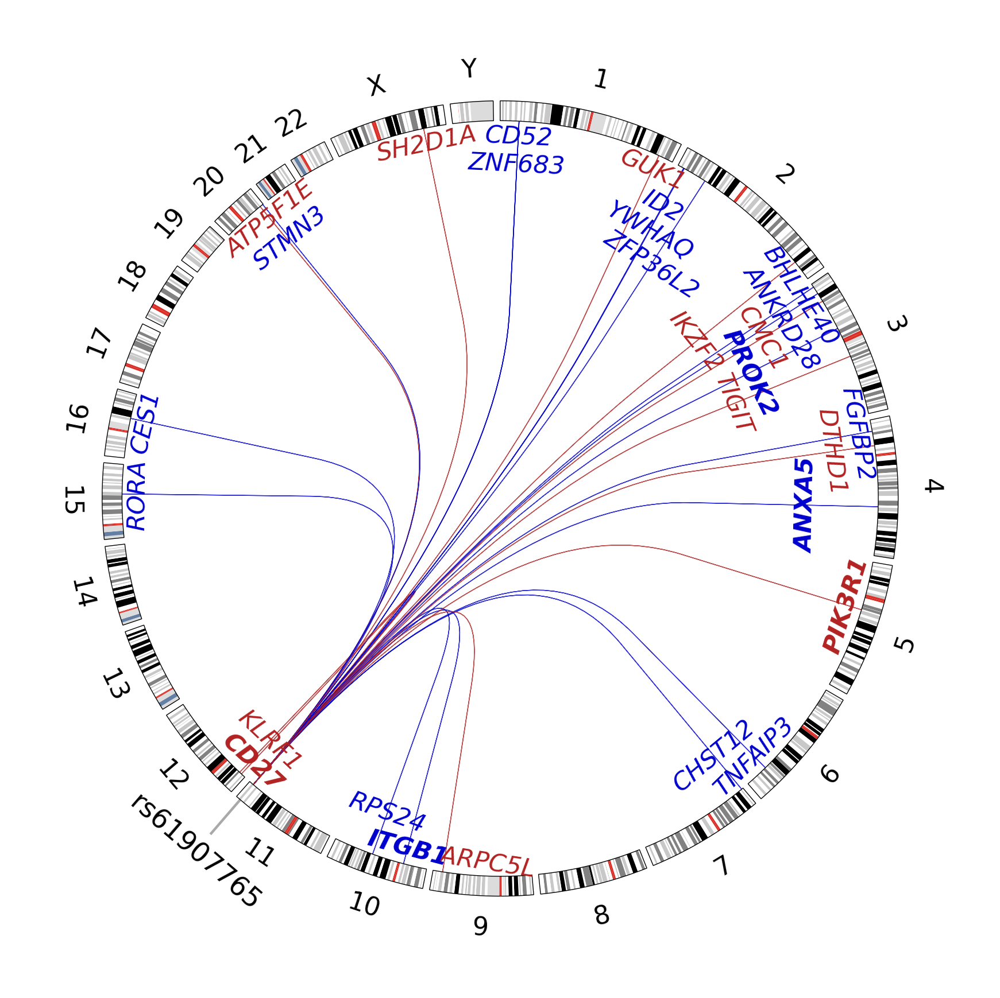

In [55]:
circos = Circos.initialize_from_bed(chr_bed_file, space=1)

# Add cytoband tracks from cytoband file
circos.add_cytoband_tracks((95, 100), cytoband_file)

# Plot chromosome name
for sector in circos.sectors:
    sector.text(sector.name.replace("chr", ""), size=16)

# Annotate SNP
sector = circos.get_sector(chr_snp)
# sector.text(
#     text=rsid,
#     x=pos_snp,
#     r=100, # inside the circle
#     size=12,
#     color="mediumblue",
#     ha="center",
#     va="center",
#     # orientation="vertical",
#     rotation="parallel"
# )
track1 = sector.add_track((98, 100))
track1.xticks(
    x=[pos_snp],
    labels=[rsid],
    outer=True,
    tick_length=11.5, # 2.5,
    label_size=17,
    label_margin=2.5, # 0.3,
    label_orientation="horizontal", # "vertical",
    line_kws={"lw":1.6, "color":"darkgrey"},
    text_kws={"color":"black"},
)

# Annotate genes
# If there's already an annotation in this chrom, place the text more inside the circle to avoid overplotting
used_chroms = [chr_snp]
annotation_fontsize = 15.5
annotation_radius = 88
mradius = 7

for snp_chrom, snp_pos, gene_chrom, gene_pos, gene_name, effect in links:
    circos.link((snp_chrom, snp_pos, snp_pos), 
                (gene_chrom, gene_pos, gene_pos), 
                direction=1, arrow_length_ratio=0.5, color="firebrick" if effect else "mediumblue", alpha=0.8, lw=0.5)
    if gene_name == "GUK1":
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=annotation_radius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_name == "ID2":
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=annotation_radius - mradius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", #"black",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_chrom == "chr7": # overplotting with chrom6
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=annotation_radius - mradius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_chrom == "chr9": # overplotting with chrom10
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text="           "+gene_name,
            x=gene_pos,
            r=annotation_radius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    else:
        if gene_chrom in used_chroms:
            occurences = used_chroms.count(gene_chrom)
            if gene_chrom == "chr2": # overplotting with chrom1
                occurences += 1
            new_radius = annotation_radius - occurences*mradius
        else:
            new_radius = annotation_radius
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=new_radius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "coral" if gene_name in ["ITGB1", "ANXA5", "PROK2", "CD27", "PIK3R1"] else "black",
            fontweight="bold" if gene_name in ["ITGB1", "ANXA5", "PROK2", "CD27", "PIK3R1"] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    used_chroms.append(gene_chrom)

fig = circos.plotfig()
plt.savefig(os.path.join(model_results_dir, "Figures", "Circos-plot_SNP-11-128391937_top-28-genes-GxC693_horizontal-SNP-name.png"),
            dpi=400, bbox_inches="tight", transparent=True)
plt.savefig(os.path.join(model_results_dir, "Figures", "Circos-plot_SNP-11-128391937_top-28-genes-GxC693_horizontal-SNP-name.eps"),
            dpi=300, bbox_inches="tight", transparent=True)
plt.savefig(os.path.join(model_results_dir, "Figures", "Circos-plot_SNP-11-128391937_top-28-genes-GxC693_horizontal-SNP-name.pdf"),
            dpi=300, bbox_inches="tight", transparent=True)